In [1]:
import sys, os, importlib
import functions
importlib.reload(functions)
from functions import *
import glob
import matplotlib.pyplot as plt

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

In [7]:
#import data
file_name="../CUBOS-AMUSING/SN2007cq.fits"#DATA/SN2010ev.fits"#"../DATA/DATACUBE_FINAL.fits"
    
    
data = fits.open(file_name)
cube = data[1].data   # this is the cube, a (3681 x 341 x 604) matrix with fluxes at different 3681 wavelengths and 308 x 318 spatial pixels ("spaxels")
header = data[1].header # this has information on the data cube
ecube = data[2].data # this is the cube uncertainty (3681 x 341 x 604)
print(np.shape(cube))


x_len=len(cube[0][0])
y_len=len(cube[0])

#  -- following is to the get the wavelength array
CRVAL = float(header["CRVAL3"])
NAXIS = int(header["NAXIS3"])
CDELT = float(header["CD3_3"])
CRPIX = float(header["CRPIX3"])
wave = np.array(CRVAL + CDELT * (np.arange(NAXIS) - CRPIX))

(3681, 327, 323)


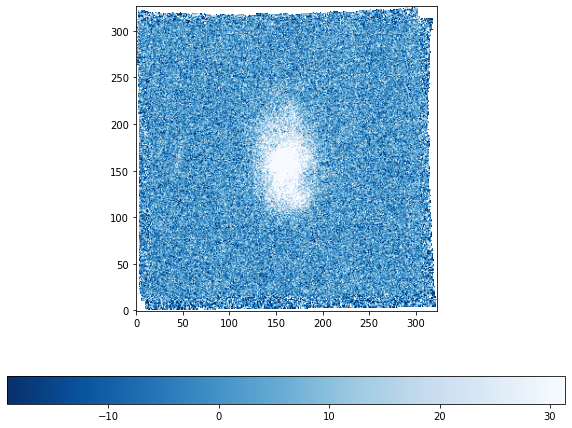

In [25]:
na_rest=(5890+5896)/2

index=findWavelengths(wave, na_rest)[1]

region=cube[:,120:200,100:200]
image=cube[index]#region[index]
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)
plt.figure(figsize=(10, 8))
#plt.title("PCA second component",fontsize=15)
plt.imshow(image,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")

z=0.025941
new_wave,cropped_cube=chop_data(wave,region,na_rest*(1+z)-100,na_rest*(1+z)+100)
#new_wave,cropped_cube=chop_data(wave,cube,na_rest-100,na_rest+100)

In [2]:
header

NameError: name 'HEADER' is not defined

In [28]:
na_rest

5893.0

making mock spectra

In [7]:

def make_signal(x, phase, amp):
    # base shape + small variation in phase/amp
    return (20 + amp*np.sin(1.5*x + phase) +amp/2*np.cos(x + phase + 1) + 0.8*np.cos(x*2 + phase*1.2) + 0.3*np.sin(x*3 + phase*2) + 0.2*np.random.randn(len(x)))

n_spectra = 100
spectra = []
for i in range(n_spectra):
    phase = np.random.uniform(0, 2*np.pi)
    amp   = np.random.uniform(0.8, 1.2)
    spectra.append(make_signal(new_wave, phase, amp))

spectra = np.array(spectra)

In [8]:
X_clean=spectra

In [8]:
normalization=True

if normalization==True:
    
    X_normalized=np.zeros(X_clean.shape)
    normalization_factor=[]
    
    for i in range(0,len(X_clean)):
        
        X_normalized[i]=X_clean[i]/np.mean(X_clean[i])
        normalization_factor.append(np.mean(X_clean[i]))

In [9]:
n_components=30

In [10]:
if normalization==True:
    X_input=X_normalized
    
    norm_map = normalization_factor
    
else:
    X_input=X_clean
    

# run PCA
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_input) 

Text(0, 0.5, 'cumulative explained variance')

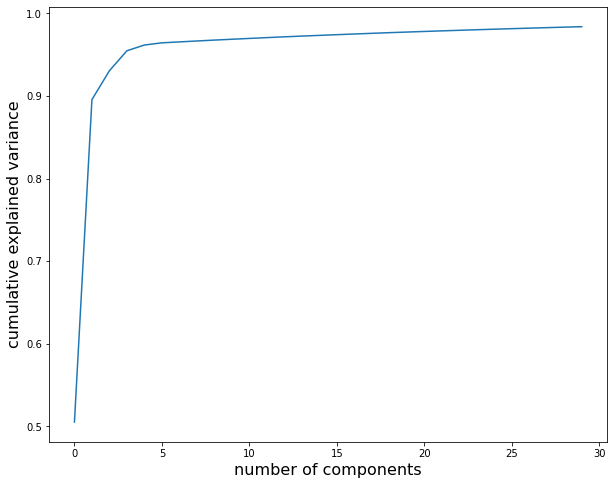

In [10]:
plt.figure(figsize=(10, 8))  
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components',fontsize=16)
plt.ylabel('cumulative explained variance',fontsize=16)

In [145]:
x=4

# reconstruct the spectra for each spaxel, using the first x components
n_pixels = X_input.shape[0]

reconstructed_spectra=[]
reconstructed_spectra_normalized=[]

for i in range(0,n_pixels):
    aux = pca.mean_.copy() 
    for j in range(0,x):
        aux +=  X_pca[i,j] * pca.components_[j]
    reconstructed_spectra.append(aux * normalization_factor[i])
    reconstructed_spectra_normalized.append(aux)


##

spectra_i=1
plt.plot(new_wave,reconstructed_spectra[spectra_i],label="Reconstructed")
plt.plot(new_wave,spectra[spectra_i],label="Original")
plt.legend()
plt.title("Reconstructed vs. original spectra (1st of the array)")
plt.show()

spectra_i=1
plt.plot(new_wave,reconstructed_spectra_normalized[spectra_i],label="Reconstructed")
plt.plot(new_wave,X_input[1],label="Input")
plt.legend()
plt.title("Reconstructed vs. original spectra (1st of the array), normalized")
plt.show()

IndexError: list index out of range

[7.8736009789691845, 5.233103439429243, 2.409784910880214, 1.9628075286055457, 1.6206686721226427, 1.5566273271645792, 1.4916667250744609, 1.4696140114878014, 1.4460948432122072, 1.421116628122804, 1.3888124173506875, 1.371186499421181, 1.3507724587377414, 1.3385757148548931, 1.3108962971087368, 1.293208435819977, 1.2638562746142266, 1.2462826188962866, 1.224588284316838, 1.2110907530382007, 1.1856417939894865, 1.1671751652775226, 1.14864278476273, 1.1327878431909029, 1.1113171331997242, 1.0923760129424163, 1.064904101615193, 1.0452744003609606, 1.0380855815789718, 1.020774138332214]


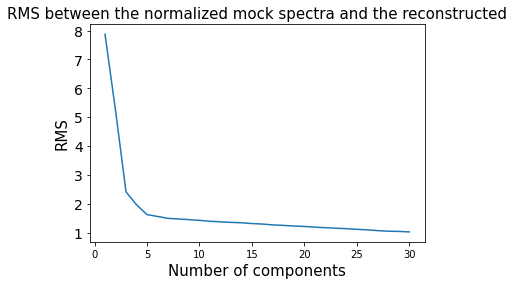

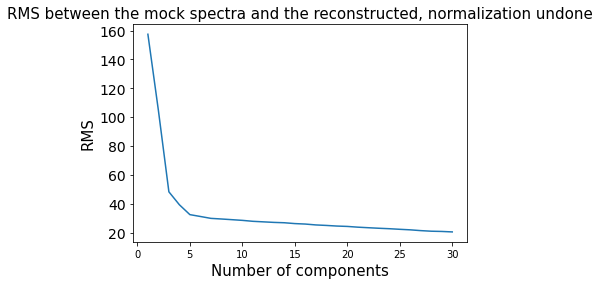

In [12]:
## PLOTTING RMS ##

## before undoing normalization

rmss=[]
for nn in range(0,n_components):

    # reconstruct the spectra for each spaxel, using the first x components
    n_pixels = X_input.shape[0]

    reconstructed_spectra=[]
    for i in range(0,n_pixels):
        aux = pca.mean_.copy() 
        for j in range(0,nn):
            aux +=  X_pca[i,j] * pca.components_[j]
        reconstructed_spectra.append(aux) #* normalization_factor[i])

    #computing rms for all spectra
    rms_array=[]
    for spectra_i in range(0,len(spectra)):
        rms=0
        for j in range(0,len(new_wave)):
            rms+=np.nansum((reconstructed_spectra[spectra_i]-X_input[spectra_i])**2)

        rms_array.append(np.sqrt(rms))

    rmss.append(np.median(rms_array)) #mean rms for all 100 spectra

print(rmss)
plt.figure(figsize=(6, 4))
plt.plot(range(1,n_components+1),rmss)
plt.title("RMS between the normalized mock spectra and the reconstructed",fontsize=15)
plt.ylabel("RMS",fontsize=15)
plt.xlabel("Number of components",fontsize=15)
plt.yticks(fontsize=14)
plt.yticks(fontsize=14);

## after undoing normalization

rmss=[]
for nn in range(0,n_components):

    # reconstruct the spectra for each spaxel, using the first x components
    n_pixels = X_input.shape[0]

    reconstructed_spectra=[]
    for i in range(0,n_pixels):
        aux = pca.mean_.copy() 
        for j in range(0,nn):
            aux +=  X_pca[i,j] * pca.components_[j]
        reconstructed_spectra.append(aux * normalization_factor[i])

    #computing rms for all spectra
    rms_array=[]
    for spectra_i in range(0,len(spectra)):
        rms=0
        for j in range(0,len(new_wave)):
            rms+=np.nansum((reconstructed_spectra[spectra_i]-spectra[spectra_i])**2)

        rms_array.append(np.sqrt(rms))

    rmss.append(np.median(rms_array)) #mean rms for all 100 spectra
    
plt.figure(figsize=(6, 4))
plt.plot(range(1,n_components+1),rmss)
plt.title("RMS between the mock spectra and the reconstructed, normalization undone",fontsize=15)
plt.ylabel("RMS",fontsize=15)
plt.xlabel("Number of components",fontsize=15)
plt.yticks(fontsize=14)
plt.yticks(fontsize=14);

In [13]:
comps=np.linspace(2,20,19)
int(comps[2])

4

In [14]:
rmss=[]
rmss__=[]

for comp in comps:
    n_components=int(comp)
    print("PCA with ", n_components," components")
    
    # run PCA
    pca = PCA(n_components=n_components)
    X_pca = pca.fit_transform(X_input)
    
    
    
    ## PLOTTING RMS ##

    ## beofre undoing normalization    
    # reconstruct the spectra for each spaxel, using all components
    n_pixels = X_input.shape[0]

    reconstructed_spectra=[]
    for i in range(0,n_pixels):
        aux = pca.mean_.copy() 
        for j in range(0,n_components):
            aux +=  X_pca[i,j] * pca.components_[j]
        reconstructed_spectra.append(aux)

    #computing rms for all spectra
    rms_array=[]
    for spectra_i in range(0,len(spectra)):
        rms=0
        for j in range(0,len(new_wave)):
            rms+=np.nansum((reconstructed_spectra[spectra_i]-X_input[spectra_i])**2)

        rms_array.append(np.sqrt(rms))

    rmss__.append(np.median(rms_array)) #mean rms for all 100 spectra
    
    
    ##########
    ## after undoing normalization    
    # reconstruct the spectra for each spaxel, using all components
    n_pixels = X_input.shape[0]

    reconstructed_spectra=[]
    for i in range(0,n_pixels):
        aux = pca.mean_.copy() 
        for j in range(0,n_components):
            aux +=  X_pca[i,j] * pca.components_[j]
        reconstructed_spectra.append(aux * normalization_factor[i])

    #computing rms for all spectra
    rms_array=[]
    for spectra_i in range(0,len(spectra)):
        rms=0
        for j in range(0,len(new_wave)):
            rms+=np.nansum((reconstructed_spectra[spectra_i]-spectra[spectra_i])**2)

        rms_array.append(np.sqrt(rms))

    rmss.append(np.median(rms_array)) #mean rms for all 100 spectra

PCA with  2  components
PCA with  3  components
PCA with  4  components
PCA with  5  components
PCA with  6  components
PCA with  7  components
PCA with  8  components
PCA with  9  components
PCA with  10  components
PCA with  11  components
PCA with  12  components
PCA with  13  components
PCA with  14  components
PCA with  15  components
PCA with  16  components
PCA with  17  components
PCA with  18  components
PCA with  19  components
PCA with  20  components


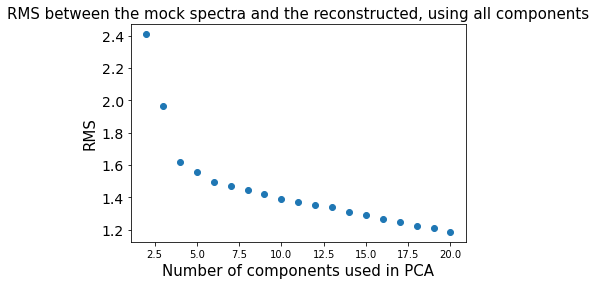

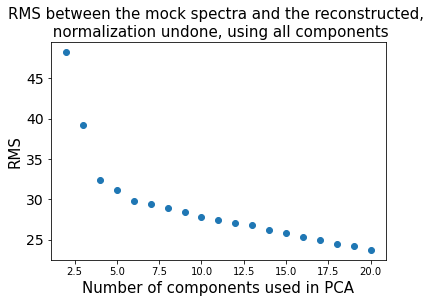

In [15]:
plt.figure(figsize=(6, 4))
plt.scatter(comps,rmss__)
plt.title("RMS between the mock spectra and the reconstructed, using all components",fontsize=15)
plt.ylabel("RMS",fontsize=15)
plt.xlabel("Number of components used in PCA",fontsize=15)
plt.yticks(fontsize=14)
plt.yticks(fontsize=14);


plt.figure(figsize=(6, 4))
plt.scatter(comps,rmss)
plt.title("RMS between the mock spectra and the reconstructed, \n normalization undone, using all components",fontsize=15)
plt.ylabel("RMS",fontsize=15)
plt.xlabel("Number of components used in PCA",fontsize=15)
plt.yticks(fontsize=14)
plt.yticks(fontsize=14);



# Galaxy data

NEW MAR2026 KS IS  43
The wrong flux error was  18413.917972246105
The corrected flux error now is  53607.439827969574


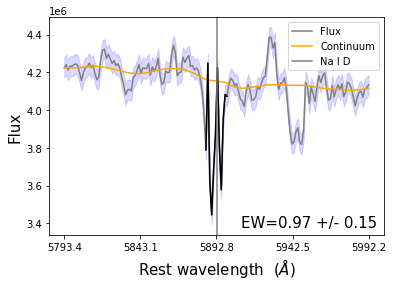


EW= 0.97  +/-  0.14736155673659007

Node separation =  61.48381294964029  Angstrom
SNR of the line is  6.59906406473295


([0.9724483535835373], [0.14736155673659007], [3130.0091438812296])

In [9]:
spectrum = np.nansum(cropped_cube[:,:,:], axis=(1, 2))
EW_voronoi_bins(np.array([spectrum]),new_wave,na_rest,v=400,KS=43,plots=True)

In [10]:
v_seps = np.arange(500,1440,40)
KSs=get_kernel_size(v_seps, na_rest, na_rest-100, na_rest+100)
KSs

array([127.85688561, 118.3860052 , 110.22145312, 103.11039162,
        96.86127698,  91.32634687,  86.38978758,  81.95954206,
        77.96151562,  74.33539861,  71.03160312,  68.00898171,
        65.23310491,  62.67494393,  60.3098517 ,  58.11676619,
        56.07758141,  54.17664645,  52.40036296,  50.73685937,
        49.17572524,  47.70779314,  46.32495856,  45.02003015])

In [11]:
best_KS = best_continuum(new_wave, spectrum, na_rest,300,na_rest-100,na_rest+100,plots=True,save="CONTINUUM.pdf")

NEW MAR2026 KS IS  319
The wrong flux error was  4384.859350449124
The corrected flux error now is  63695.16236068495

EW= 0.95  +/-  0.31588660601956614

Node separation =  456.12410071942446  Angstrom
SNR of the line is  2.9960832832041295
NEW MAR2026 KS IS  255
The wrong flux error was  1407.9987769553145
The corrected flux error now is  62082.60987744192

EW= 0.94  +/-  0.3141184624108601

Node separation =  364.613309352518  Angstrom
SNR of the line is  2.9989741963761256
NEW MAR2026 KS IS  213
The wrong flux error was  5394.545347761611
The corrected flux error now is  60982.48044772853

EW= 0.94  +/-  0.3128960926339825

Node separation =  304.5593525179856  Angstrom
SNR of the line is  3.000938714571605
NEW MAR2026 KS IS  182
The wrong flux error was  8255.83861120565
The corrected flux error now is  60201.194100294524

EW= 0.94  +/-  0.31162523130782166

Node separation =  260.2338129496403  Angstrom
SNR of the line is  3.002748002374239
NEW MAR2026 KS IS  159
The wrong flux e

In [12]:
best_KS

58

NEW MAR2026 KS IS  100
The wrong flux error was  30881.516537656822
The corrected flux error now is  53725.67227713504


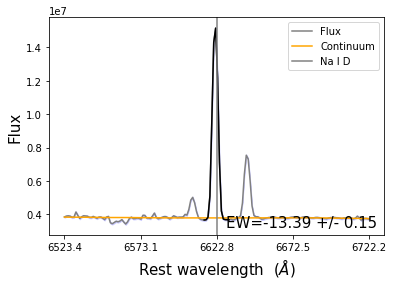


EW= -13.39  +/-  0.1452911393053334

Node separation =  164.25619834710744  Angstrom
SNR of the line is  -92.12878346379962


([-13.385495912269807], [0.1452911393053334], [7439.967118279728])

In [13]:
halpha=6562.8*(1+0.009213)
NW,CC=chop_data(wave,cube,halpha-100,halpha+100)

spectrum = np.nansum(CC[:,:,:], axis=(1, 2))
EW_voronoi_bins(np.array([spectrum]),NW,halpha,v=400,KS=100,plots=True)

The sigma of Halpha emission is  1.745214239140741  +/-  0.07056560811524501


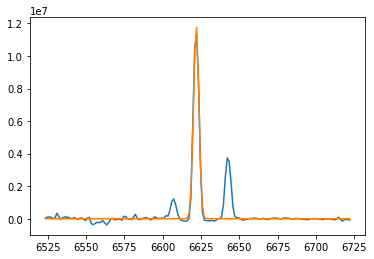

In [14]:
y=spectrum-np.median(spectrum)
popt, pcov = curve_fit(gaussian,NW,y,p0=[100000000,halpha,1],maxfev=20000)

model_flux = gaussian(NW, *popt)

plt.plot(NW,y)

plt.plot(NW,model_flux)

perr = np.sqrt(np.diag(pcov))


print("The sigma of Halpha emission is ",popt[2]," +/- ",perr[2])

fwhm=2sqrt(2*ln(2))sigma

In [15]:
1.75*2*np.sqrt(2*math.log(2))

4.120935078804162

# PCA

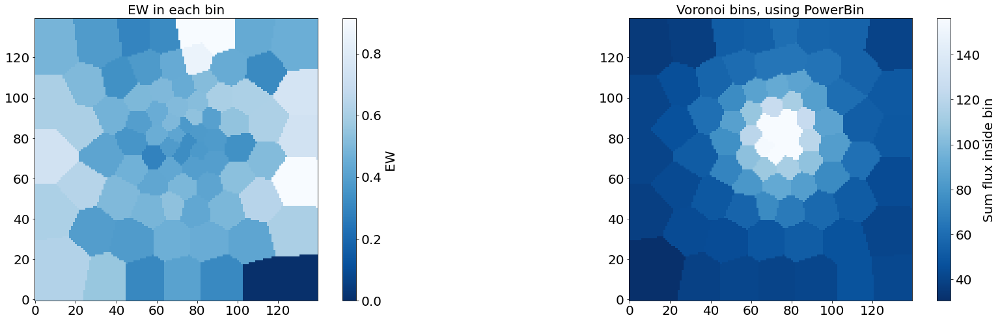

In [18]:
normalization=True####False##########################################True
voronoi=True

if voronoi==True:

    #import data
    spec_voronoi_bins = np.load("../DATA/ori_bins_withoutstars/all_bin_spectra.npy")
    bin_map = np.load("../DATA/ori_bins_withoutstars/bin_map.npy")
    EWs_map_bins = np.load("../DATA/ori_bins_withoutstars/EWs_map_bins.npy")
    binned_img = np.load("../DATA/ori_bins_withoutstars/binned_img.npy")
    
    fig, ax = plt.subplots(1, 2, figsize=(30, 8))
    
    image = EWs_map_bins
    lo, up = np.nanpercentile(image, 4), np.nanpercentile(image, 96)
    cmap = plt.cm.Blues_r.copy()
    im1 = ax[0].imshow(image, cmap=cmap, origin='lower', clim=(lo, up))
    cbar=fig.colorbar(im1, ax=ax[0],orientation="vertical")
    ax[0].set_title("EW in each bin",fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    ax[0].tick_params(axis='both', which='major', labelsize=20)
    cbar.set_label("EW", fontsize=20)
    
    image = binned_img
    lo, up = np.nanpercentile(image, 2), np.nanpercentile(image, 98)
    cmap = plt.cm.Blues_r.copy()
    im1 = ax[1].imshow(image, cmap=cmap, origin='lower', clim=(lo, up))
    cbar=fig.colorbar(im1, ax=ax[1],orientation="vertical")
    ax[1].set_title("Voronoi bins, using PowerBin",fontsize=20)
    cbar.ax.tick_params(labelsize=20)
    ax[1].tick_params(axis='both', which='major', labelsize=20)
    cbar.set_label("Sum flux inside bin", fontsize=20)
    
    
    #### working with the voronoi bins spectra
    X_clean=spec_voronoi_bins
else:
    # 1. Prepare and Mask (using original flux, no normalization)
    n_wave, ny, nx = cropped_cube.shape
    X = cropped_cube.reshape(n_wave, -1).T
    mask = np.isfinite(X).all(axis=1)
    X_clean = X[mask]


In [19]:
if normalization==True:
    
    X_normalized=np.zeros(X_clean.shape)
    normalization_factor=[]
    continuum_factor=[]
    mad_factor=[]
    
    if voronoi==True:
        continuum_bins=[]
    
    KS=100
    for i in range(0,len(X_clean)):
        
        
        x_chopped,y_chopped=new_wave,X_clean[i]
        
        x,y=x_chopped,y_chopped
        x_cont,y_cont=filterout_peaks(x,y,low=30, high=65,mode="both")#this used to be 30 and 70 respectively, but i found 20 and 65 is better

        # continuum

        delta_x = np.average(np.diff(x_cont))  # spacing in Å between x points
        
        kernel_size=KS
        kernel = cosine_kernel(kernel_size)
        cont = convolve1d(y_cont, kernel, mode='nearest')
        
        
        interp=interp1d(x_cont, cont, kind='cubic',fill_value="extrapolate")
        
        #normalization: dividing by continuum
        #X_normalized[i]=X_clean[i]/np.mean(interp(new_wave))
        #normalization_factor.append(np.mean(interp(new_wave)))
        
        #normalization: subtracting continuum, and dividing by mad
        mad=np.mean(np.abs(interp(new_wave) - np.mean(interp(new_wave))))
        cont=np.mean(interp(new_wave))
        continuum_factor.append(cont)
        mad_factor.append(mad)
        X_normalized[i]=(X_clean[i]-cont)/mad
        if voronoi==True:
            continuum_bins.append(interp(new_wave))
        
        

Before and after normalization


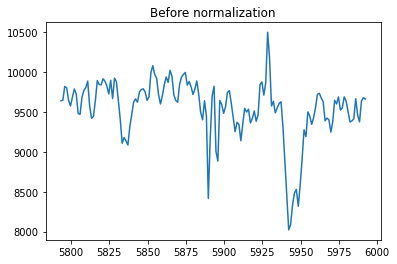

Text(0.5, 1.0, 'After normalization')

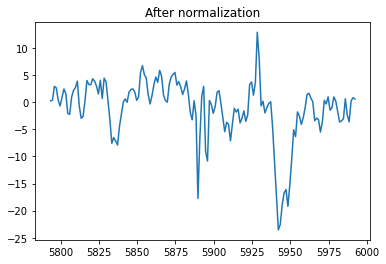

In [20]:
print("Before and after normalization")

plt.title("Before normalization")
plt.plot(new_wave,X_clean[1])
plt.show()

plt.plot(new_wave,X_normalized[1])
plt.title("After normalization")

In [21]:
if normalization==True:
    
    X_input=X_normalized
    
    if voronoi==False:
        #normalization: dividing by continuum
        #norm_map = np.full(ny * nx, np.nan)
        #norm_map[mask] = normalization_factor
        #norm_map = norm_map.reshape(ny, nx)

        #normalization: subtracting continuum, and dividing by mad #THIS: fazer mapas do continuum, mad para o voronoi bins
        continuum_map = np.full(ny * nx, np.nan)
        mad_map = np.full(ny * nx, np.nan)
        continuum_map[mask] = continuum_factor
        continuum_map = continuum_map.reshape(ny, nx)
        mad_map[mask] = mad_factor
        mad_map = mad_map.reshape(ny, nx)
    else:
        #bins case, COnfirm thiss!!
        ny, nx = bin_map.shape
        continuum_map = np.full((ny, nx), np.nan)
        mad_map = np.full((ny, nx), np.nan)

        for b in range(len(continuum_factor)):
            mask_bin = (bin_map == b)
            continuum_map[mask_bin] = continuum_factor[b]
            mad_map[mask_bin] = mad_factor[b]
    
else:
    X_input=X_clean

In [22]:
N=10

In [23]:
# run PCA
pca = PCA(n_components=N)
X_pca = pca.fit_transform(X_input) 

Text(0, 0.5, 'cumulative explained variance')

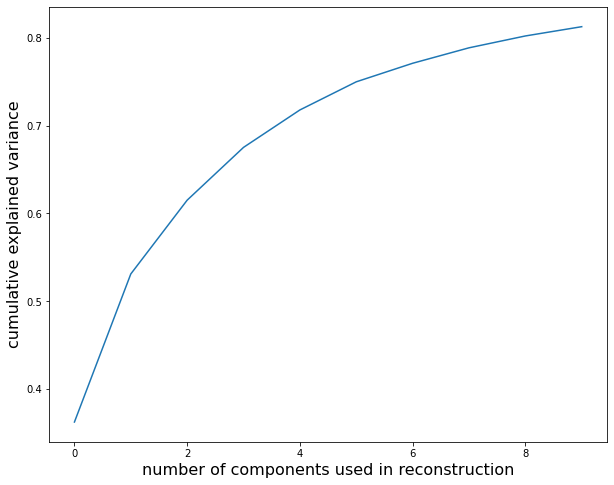

In [24]:
plt.figure(figsize=(10, 8))  
plt.plot(np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('number of components used in reconstruction',fontsize=16)
plt.ylabel('cumulative explained variance',fontsize=16)

In [25]:
# number of components to use for reconstruction
x = 9

In [26]:
np.shape(pca.components_)

(10, 160)

In [27]:
if voronoi==False:# plotting the maps of the components
    pc_maps = []


    for j in range(N):

        m = np.full(ny * nx, np.nan)
        # assign only valid pixels from PCA scores
        m[mask] = X_pca[:, j]

        pc_maps.append(m.reshape(ny, nx))
else:
    
    
    pc_maps = []

    for j in range(N):
        m = np.full((ny, nx), np.nan)

        for b in range(X_pca.shape[0]):   # loop over bins
            
            mask = (bin_map == b)
            m[mask] = X_pca[b, j]

        pc_maps.append(m)



    """pc_maps = []
    nx,ny=bin_map.shape
    for j in range(N):

        m = np.full((ny, nx), np.nan)

        for b in range(spec_voronoi_bins.shape[0]):  # loop over bins
            m[bin_map == b] = X_pca[b, j]            # assign bin score to pixels

        pc_maps.append(m)""";

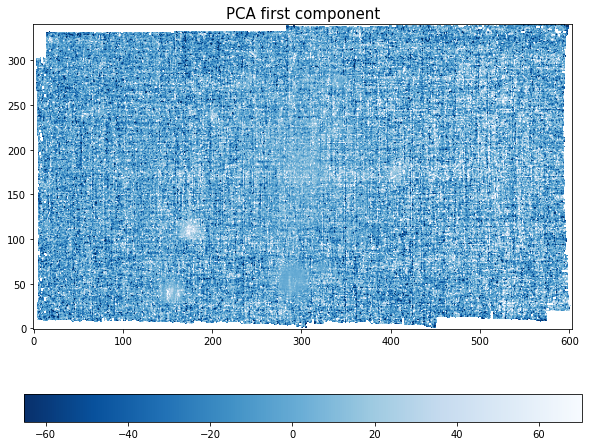

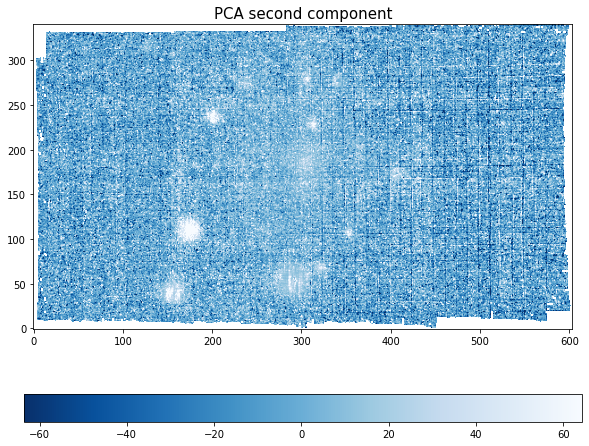

In [31]:

pc1_map = pc_maps[0]
pc2_map = pc_maps[1]

image=pc1_map
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)
plt.figure(figsize=(10, 8))
plt.title("PCA first component",fontsize=15)
plt.imshow(image,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")

plt.show()

image=pc2_map
lo,up = np.nanpercentile(image,2),np.nanpercentile(image,98)
plt.figure(figsize=(10, 8))
plt.title("PCA second component",fontsize=15)
plt.imshow(image,cmap='Blues_r',origin='lower',clim=(lo,up))
plt.colorbar(orientation="horizontal")

plt.show()
##
"""pcs=pca.components_
np.shape(pcs)
for i in range(len(pcs)):
    plt.plot(new_wave,pcs[i])
    plt.show()""";

plot the components spectra

In [32]:
normalization

True

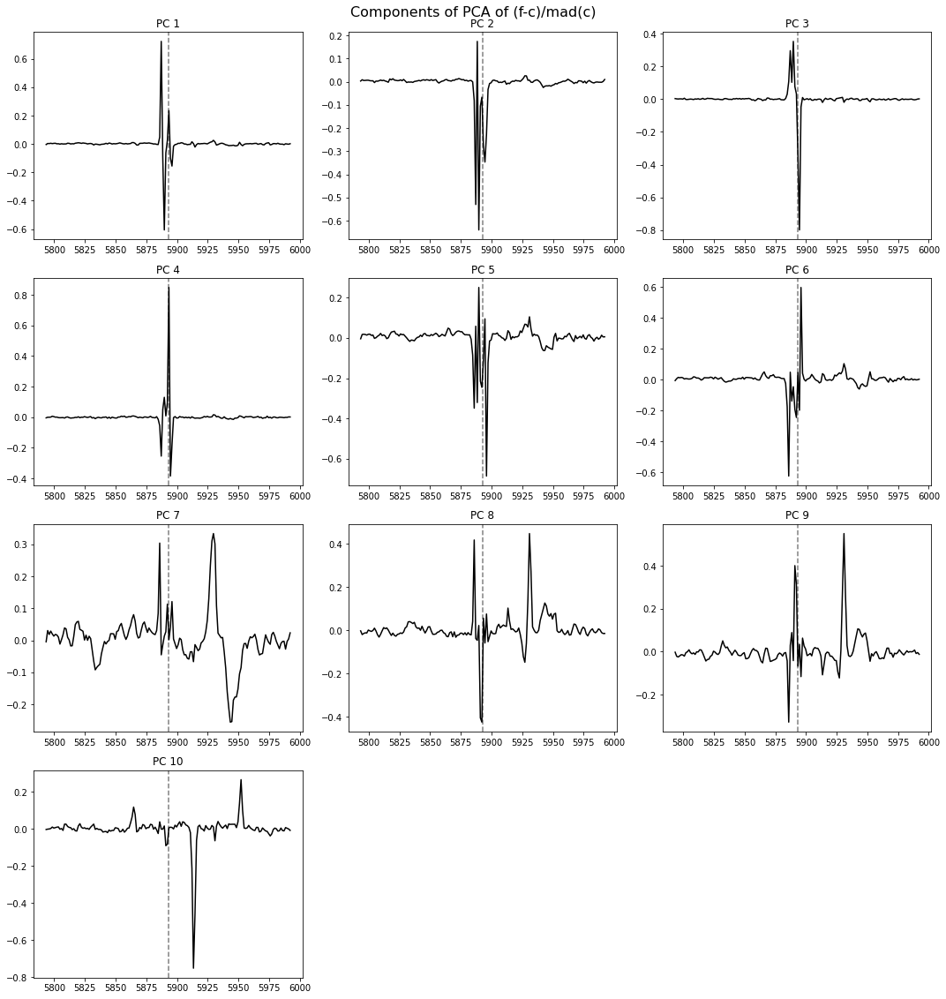

In [33]:
ncols = 3
nrows = int(np.ceil(N / ncols))


fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
axes = axes.flatten()
fig.suptitle("Components of PCA of (f-c)/mad(c)",fontsize=16)
for k in range(N):
    axes[k].plot(new_wave, pca.components_[k],color="black")
    axes[k].axvline(x=na_rest, color='black', alpha=0.5,linestyle="dashed",zorder=0)
    axes[k].set_title(f"PC {k+1}")

# hide unused panels
for k in range(N, len(axes)):
    axes[k].axis("off")

plt.tight_layout()
plt.show()

In [34]:
"""ncols = 3
nrows = int(np.ceil(N / ncols))


fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 4*nrows))
axes = axes.flatten()
fig.suptitle("Components of PCA of f",fontsize=16)
for k in range(N):
    axes[k].plot(new_wave, (pca.mean_.copy()+ np.mean(X_pca[:,k]) * pca.components_[k])*np.mean(normalization_factor),color="black")
    axes[k].axvline(x=na_rest, color='black', alpha=0.5,linestyle="dashed",zorder=0)
    axes[k].set_title(f"PC {k+1}")

# hide unused panels
for k in range(N, len(axes)):
    axes[k].axis("off")

plt.tight_layout()
plt.show()"""; #this is just needed when the X_input is f/c, not (f-c)/mad

In [35]:
#computing median of each component map
projections_means=[]
projections_stddev=[]
for i in range(0,N):
    projections_means.append(np.nanmean(pc_maps[i]))
    projections_stddev.append(np.nanstd(pc_maps[i]))

In [36]:
#eigenspectra 1
#fake_specs =  a1_fake * E1 + <a2>*E2 + <a3>*E3 +.....
#where <an> are the mean of the projections an of all spaxels
#a1_fake is an array of a1 projections going between <a1> - std(a1) and <a1> + std(a1)

In [39]:
#fake_a1=np.linspace(projections_means[0]-projections_stddev[0],projections_means[0]+projections_stddev[0],10)
fake_as=[]
for i in range(N):
    fake_ai=np.linspace(projections_means[i]-projections_stddev[i],projections_means[i]+projections_stddev[i],10)
    fake_as.append(fake_ai)

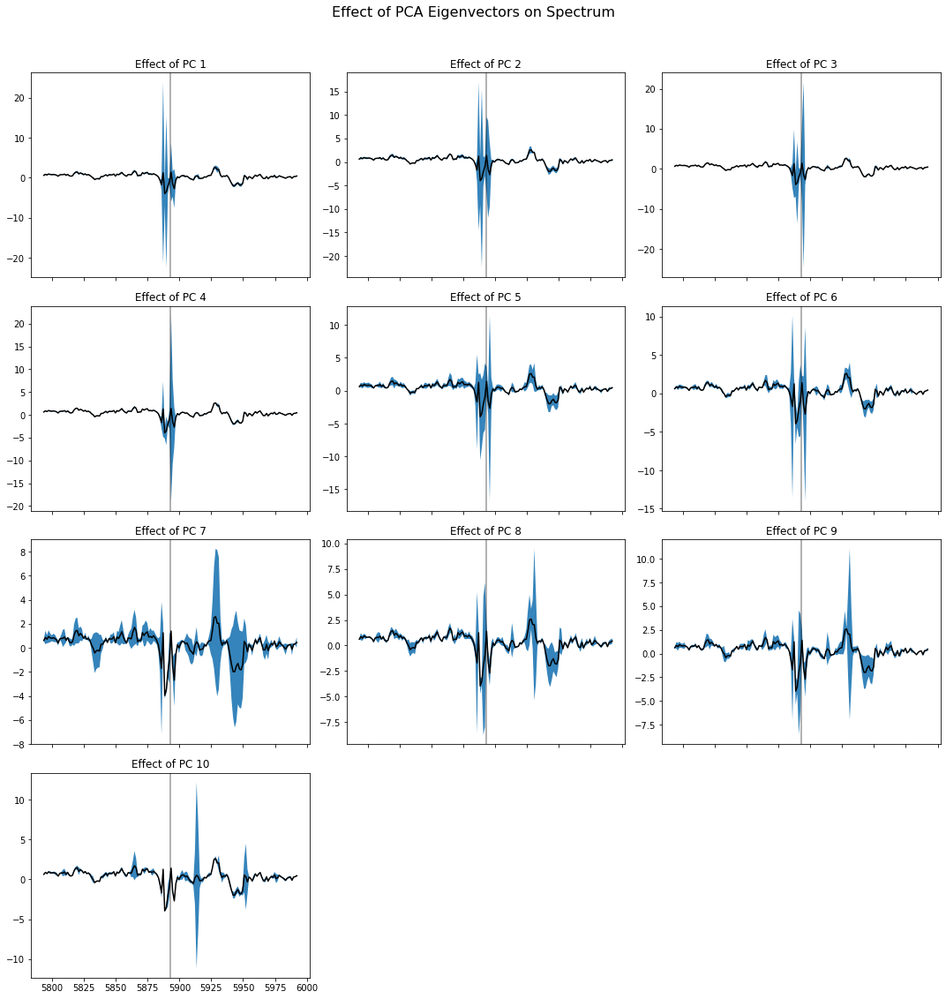

In [40]:
ncols = 3
nrows = int(np.ceil(N / ncols))

fig, axes = plt.subplots(nrows, ncols,figsize=(5*ncols, 4*nrows),sharex=True)

axes = axes.flatten()

for k in range(N):

    fake_specs = []

    aux = pca.mean_.copy()

    for j in range(N):
        if j != k:
            aux += projections_means[j] * pca.components_[j]

    for i in range(0,len(fake_as[k])):
        #fake_specs.append(fake_a1[i] * pca.components_[k] + aux)
        fake_specs.append(fake_as[k][i] * pca.components_[k] + aux)

    fake_specs = np.array(fake_specs)
    
    # envelope
    min_spec = np.min(fake_specs, axis=0)
    max_spec = np.max(fake_specs, axis=0)
    mean_spec = np.mean(fake_specs, axis=0)
    
    ax = axes[k]
    ax.fill_between(new_wave, min_spec, max_spec, alpha=0.9)
    ax.plot(new_wave, mean_spec, color='black', lw=1.5)
    
    ax.axvline(na_rest, color='k', alpha=0.4)

    ax.set_title(f"Effect of PC {k+1}")
    #ax.set_ylim([-30,30])
    
    cmap = plt.cm.copper
    colors = cmap(np.linspace(0, 1, fake_specs.shape[0]))

    #for i, spec in enumerate(fake_specs):
    #    ax.plot(new_wave, spec, color=colors[i], lw=1.5)


# hide unused panels
for k in range(N, len(axes)):
    axes[k].axis("off")



fig.suptitle("Effect of PCA Eigenvectors on Spectrum", fontsize=16)
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()

the same as above but denormalized

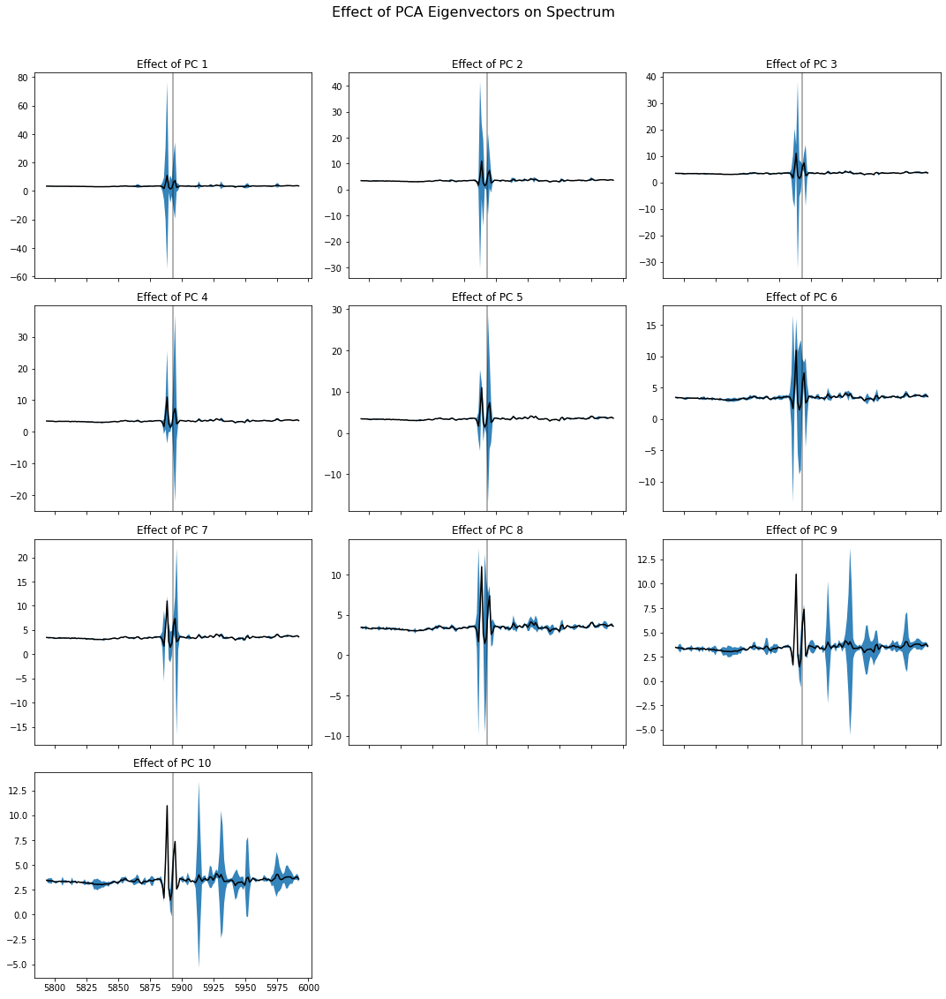

In [28]:
if normalization==True:
    ncols = 3
    nrows = int(np.ceil(N / ncols))

    fig, axes = plt.subplots(nrows, ncols,figsize=(5*ncols, 4*nrows),sharex=True)

    axes = axes.flatten()

    for k in range(N):

        fake_specs = []

        aux = pca.mean_.copy()

        for j in range(N):
            if j != k:
                aux += projections_means[j] * pca.components_[j]

        for i in range(0,len(fake_as[k])):
            #fake_specs.append(fake_a1[i] * pca.components_[k] + aux)
            fake_specs.append(fake_as[k][i] * pca.components_[k] + aux)

        fake_specs = np.array(fake_specs)
        fake_specs=fake_specs*np.median(mad_factor)+np.median(continuum_factor)

        # envelope
        min_spec = np.min(fake_specs, axis=0)
        max_spec = np.max(fake_specs, axis=0)
        mean_spec = np.mean(fake_specs, axis=0)

        ax = axes[k]
        ax.fill_between(new_wave, min_spec, max_spec, alpha=0.9)
        ax.plot(new_wave, mean_spec, color='black', lw=1.5)

        ax.axvline(na_rest, color='k', alpha=0.4)

        ax.set_title(f"Effect of PC {k+1}")
        #ax.set_ylim([-30,30])

        cmap = plt.cm.copper
        colors = cmap(np.linspace(0, 1, fake_specs.shape[0]))

        #for i, spec in enumerate(fake_specs):
        #    ax.plot(new_wave, spec, color=colors[i], lw=1.5)


    # hide unused panels
    for k in range(N, len(axes)):
        axes[k].axis("off")



    fig.suptitle("Effect of PCA Eigenvectors on Spectrum", fontsize=16)
    plt.tight_layout(rect=[0, 0, 1, 0.96])
    plt.show()


plot to find flat PC1

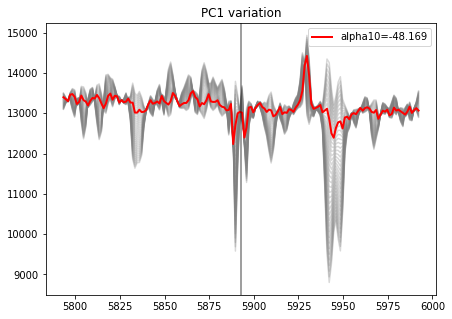

In [31]:
alpha_range = np.linspace(projections_means[0] - 5*projections_stddev[0],projections_means[0] + 5*projections_stddev[0],40)

maskk = (new_wave > na_rest - 5) & (new_wave < na_rest + 5)
specs = []
variances = []

for a1 in alpha_range:
    spec = pca.mean_ + a1 * pca.components_[0]
    spec = spec * np.median(mad_factor) + np.median(continuum_factor)
    
    specs.append(spec)
    variances.append(np.var(spec[maskk]))

specs = np.array(specs)
variances = np.array(variances)

# alpha for flattest Na region
best_idx = np.argmin(variances)
alpha10 = alpha_range[best_idx]


plt.figure(figsize=(7,5))
for i, spec in enumerate(specs):
    plt.plot(new_wave, spec, color='gray', alpha=0.3)

plt.plot(new_wave, specs[best_idx], color='red', lw=2, label=f'alpha10={alpha10:.3f}')

plt.axvline(na_rest, color='k', alpha=0.5)
plt.title("PC1 variation")
plt.legend()
plt.show()

removing emission from spaxels spectra

In [103]:
remove_emission_component = True

if remove_emission_component==True:
    pc1 = pca.components_[0]
    
    delta_alpha = X_pca[:, 0] - alpha10

    # build correction in (f-c)/mad
    correction = np.outer(delta_alpha, pc1)
    
    reconstructed_spectra = X_input - correction
    reconstructed_spectra = reconstructed_spectra * np.array(mad_factor)[:, None] + np.array(continuum_factor)[:,None]
    
    reconstructed_cube = np.full((n_wave, ny, nx), np.nan)
    reconstructed_cube_2d = reconstructed_cube.reshape(n_wave, ny * nx)

    reconstructed_cube_2d[:, mask] = reconstructed_spectra.T

    reconstructed_cube = reconstructed_cube_2d.reshape(n_wave, ny, nx)

IndexError: too many indices for array: array is 2-dimensional, but 3 were indexed

Reconstruction using certain PCA components

In [30]:
# reconstruct the spectra for each spaxel (or for each BIN), using the first x components
n_pixels = X_input.shape[0]
print("n_pixels = ",n_pixels)

reconstructed_spectra=[]
for i in range(0,n_pixels):
    aux = pca.mean_.copy() 
    for j in range(0,x):
        if j==0 or j==9:# or j==3 or j==4 or j==5:
            print("Warning, using just the first component for reconstruction of spectra")
            aux +=  X_pca[i,j] * pca.components_[j]
        
    if normalization==True:
        #normalization: dividing by continuum
        #reconstructed_spectra.append(aux * normalization_factor[i])

        #normalization: subtracting continuum, and dividing by mad
        reconstructed_spectra.append(aux * mad_factor[i] + continuum_factor[i])
    else:
        reconstructed_spectra.append(aux)
    
reconstructed_spectra = np.array(reconstructed_spectra)

n_pixels =  90770
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Wa

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just the first component for reconstruction of spectra
Warning, using just 

In [31]:
if voronoi==False:
    n_wave = len(new_wave)

    reconstructed_cube = np.full((n_wave, ny, nx), np.nan)
    reconstructed_cube_2d = reconstructed_cube.reshape(n_wave, ny * nx)
    reconstructed_cube_2d[:, mask] = reconstructed_spectra.T
    reconstructed_cube = reconstructed_cube_2d.reshape(n_wave, ny, nx)

    np.shape(reconstructed_cube)

else:
    n_wave = len(new_wave)

    reconstructed_cube = np.full((n_wave, ny, nx), np.nan)

    for b in range(len(reconstructed_spectra)): ###N ofbins
        mask_bin = (bin_map == b)
        reconstructed_cube[:, mask_bin] = reconstructed_spectra[b][:, None]

In [32]:
## plot EW of original vs reconstructed spectra

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0176846714466374
The corrected flux error now is  0.15617072692993456


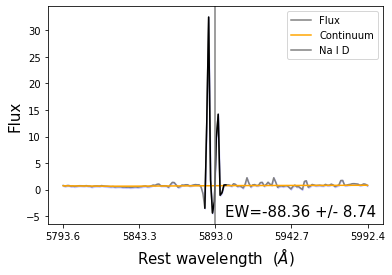



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.4432497913829196
The corrected flux error now is  2.293128875204301


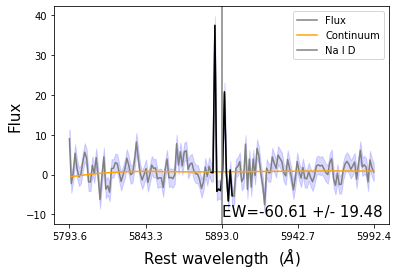

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0223699643163167
The corrected flux error now is  0.17467358298502825


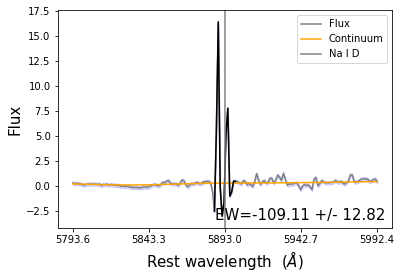



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.998411774784813
The corrected flux error now is  2.9306165234851145


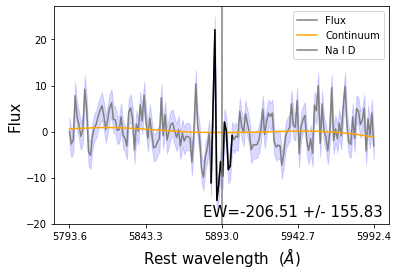

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.038617684969758
The corrected flux error now is  0.22563005192528676


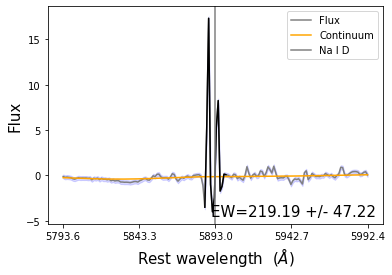



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.138225735722077
The corrected flux error now is  2.1226354974253323


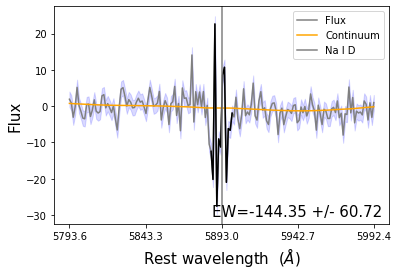

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.025039343533928
The corrected flux error now is  0.18565672765475813


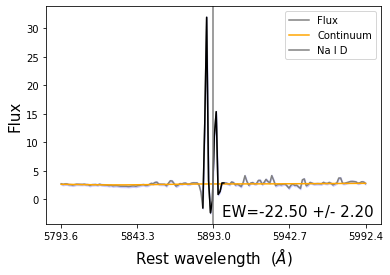



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.4170194274687504
The corrected flux error now is  4.751706126377863


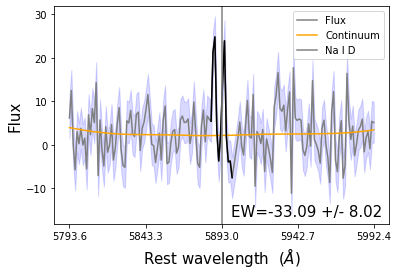

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0332412645092677
The corrected flux error now is  0.2100975818853031


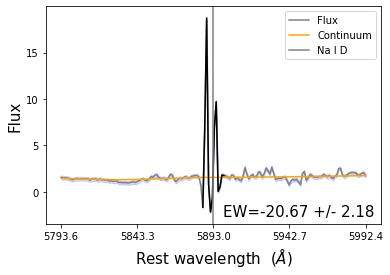



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.5483186550706438
The corrected flux error now is  3.1390821700353992


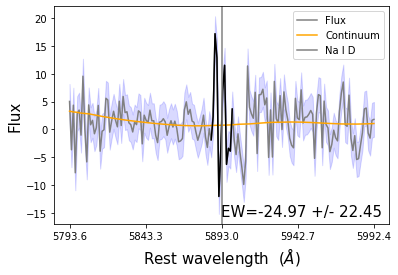

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0162251888684082
The corrected flux error now is  0.14640585043177948


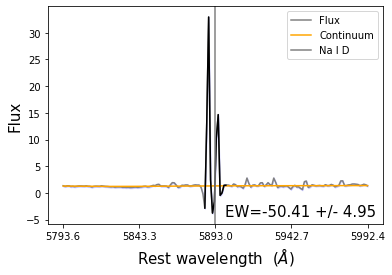



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.6432485788836981
The corrected flux error now is  2.7846992446940253


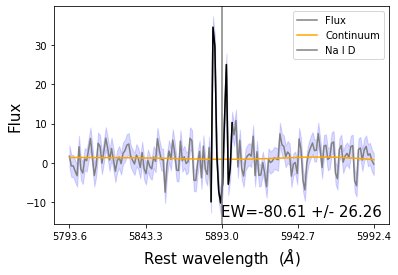

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0348229209567847
The corrected flux error now is  0.28546140185554186


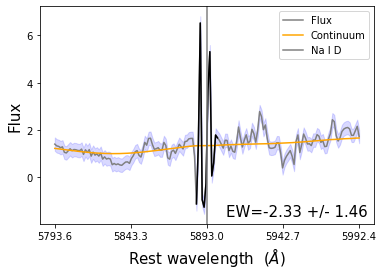



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  3.2654784070812815
The corrected flux error now is  3.314079694153789


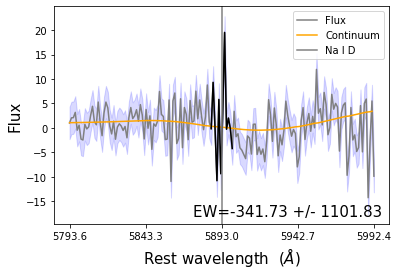

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0331061146752927
The corrected flux error now is  0.21458786111127395


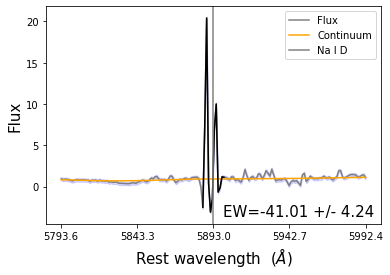



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.360920497178549
The corrected flux error now is  3.1445382368782413


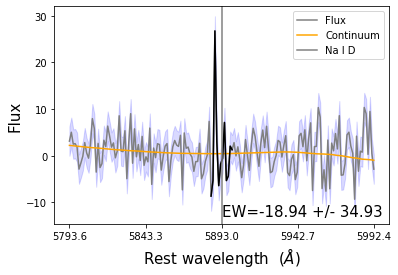

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0196201395086888
The corrected flux error now is  0.15901654047438044


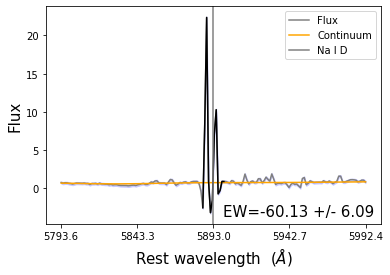



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.133113300491255
The corrected flux error now is  2.491679620537766


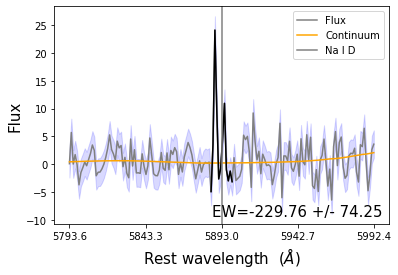

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.024662734271737
The corrected flux error now is  0.1823759845155708


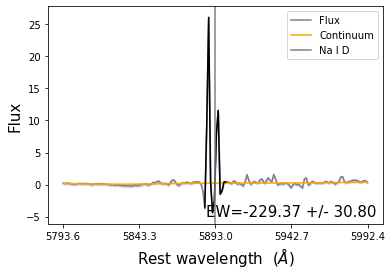



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.776296435941237
The corrected flux error now is  2.705983072226257


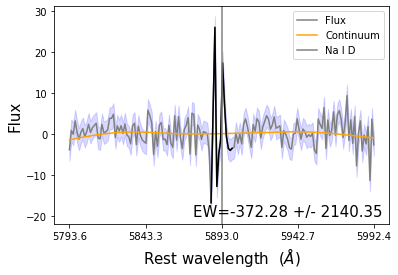

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0263514496771413
The corrected flux error now is  0.19125011150813562


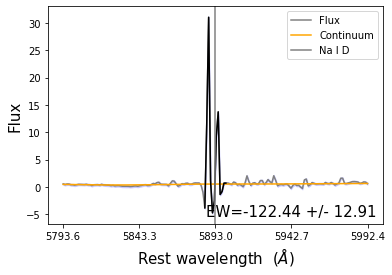



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.002609817269918
The corrected flux error now is  2.2720151175428036


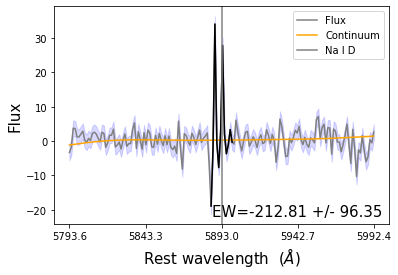

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.02027421343234
The corrected flux error now is  0.16367344208134482


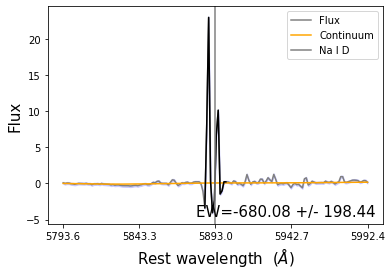



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.7717277601236434
The corrected flux error now is  1.8594163951871905


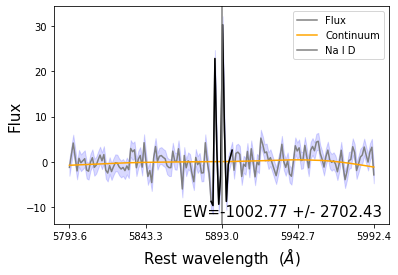

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0107415853796182
The corrected flux error now is  0.12124395153998768


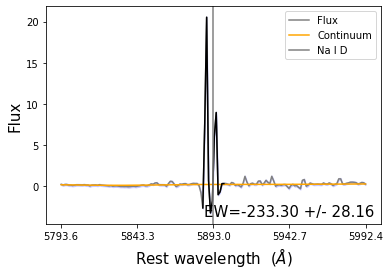



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.2702575089866874
The corrected flux error now is  1.9900637829858379


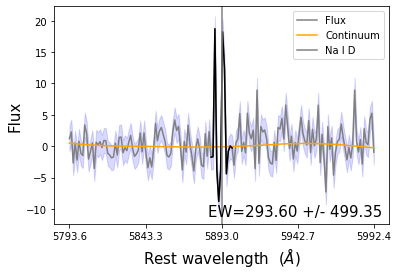

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0130248120813534
The corrected flux error now is  0.12879403149407953


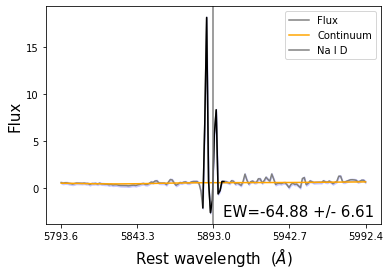



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  2.7371082503664987
The corrected flux error now is  1.9668000453147478


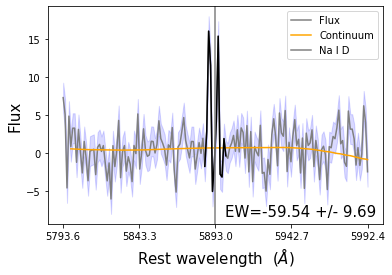

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0263991911388675
The corrected flux error now is  0.19224950454775577


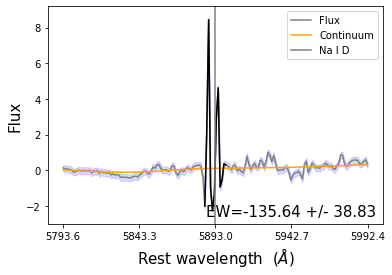



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  3.36547559833021
The corrected flux error now is  2.636728021795054


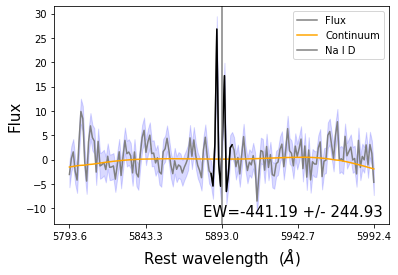

-- From reconstructed spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.0202132246781292
The corrected flux error now is  0.16086443454256702


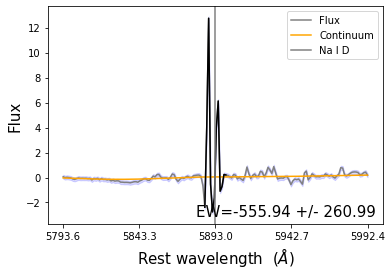



-- From original spectra:
NEW MAR2026 KS IS  100
The wrong flux error was  1.222560034022998
The corrected flux error now is  2.725578019442303


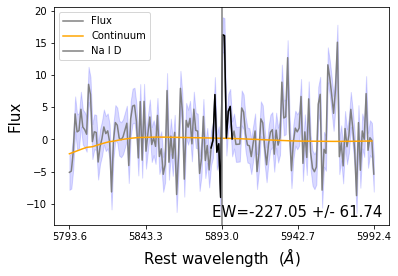

-- From reconstructed spectra:
NEW MAR2026 KS IS  100


/home/rita13santos/anaconda3/lib/python3.9/site-packages/numpy/lib/function_base.py:520: RuntimeWarning: Mean of empty slice.
  avg = a.mean(axis, **keepdims_kw)
/home/rita13santos/anaconda3/lib/python3.9/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


ValueError: cannot reshape array of size 0 into shape (0,newaxis)

In [33]:
EWs_recon=[]
EWs_ori=[]
    
if voronoi==False:
    ys = np.arange(170, 201)
    xs = np.arange(290, 326)

    
    kk=0
    for y in ys:
        for x in xs:

            kk+=1
            if kk<50:
                ifplot=True
            else:
                ifplot=False

            print("-- From reconstructed spectra:")
            EWs_recon.append(EW_voronoi_bins(np.array([reconstructed_cube[:,y,x]]), new_wave, na_rest, v=400, KS=100, text=False,plots=ifplot)[0][0])
            print("\n\n-- From original spectra:")
            EWs_ori.append(EW_voronoi_bins(np.array([cropped_cube[:,y,x]]), new_wave, na_rest, v=400, KS=100, text=False,plots=ifplot)[0][0])
            
else:
    kk=0
    for i in range(0,len(reconstructed_spectra)):

        kk+=1
        if kk<50:
            ifplot=True
        else:
            ifplot=False
    
        print("----------------")
        print("\n\n\n\n\n-- From reconstructed spectra:")
        EWs_recon.append(EW_voronoi_bins(np.array([reconstructed_spectra[i]]), new_wave, na_rest, v=400, KS=100, text=False,plots=ifplot)[0][0])
        print("\n\n-- From original spectra:")
        if normalization==True:
            aux=spec_voronoi_bins[i]
        else:
            X_input[i]
        EWs_ori.append(EW_voronoi_bins(np.array([aux]), new_wave, na_rest, v=400, KS=100, text=False,plots=ifplot)[0][0])
            
    

Text(0, 0.5, 'EW from original spectra')

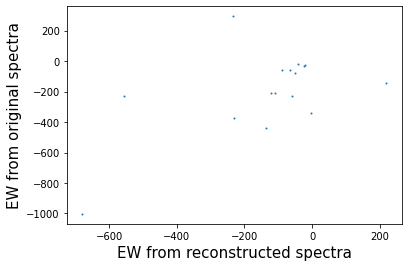

In [34]:
plt.scatter(EWs_recon,EWs_ori,s=1)
plt.xlabel("EW from reconstructed spectra",fontsize=15)
plt.ylabel("EW from original spectra",fontsize=15)

Text(0.98, 0.1, 'Rec spec: Median -76.62, Sigma -76.62')

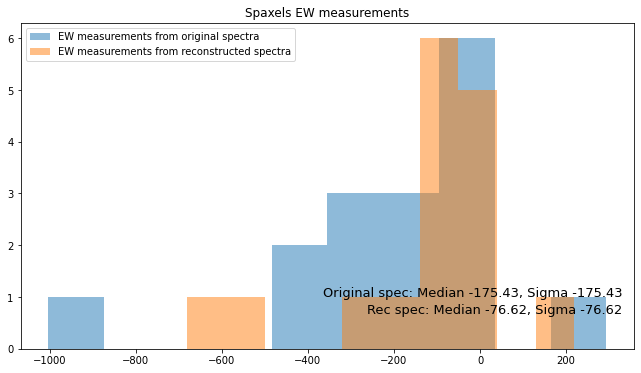

In [35]:
median_ori = np.median(EWs_ori)
sigma_ori = np.std(EWs_ori)

median_recon = np.median(EWs_recon)
sigma_recon = np.std(EWs_recon)

plt.figure(figsize=(11, 6))
plt.title("Spaxels EW measurements")
plt.hist(EWs_ori,label="EW measurements from original spectra",alpha=0.5)
plt.hist(EWs_recon,label="EW measurements from reconstructed spectra",alpha=0.5)
plt.legend()
plt.text(0.98,0.15, f"Original spec: Median {median_ori:.2f}, Sigma {median_ori:.2f}", ha='right', va='bottom', transform=plt.gca().transAxes,fontsize=13)
plt.text(0.98,0.1, f"Rec spec: Median {median_recon:.2f}, Sigma {median_recon:.2f}", ha='right', va='bottom', transform=plt.gca().transAxes,fontsize=13)


# gaussian fits

In [26]:
normalization=True####False##########################################True
voronoi=True

#import data
spec_voronoi_bins = np.load("../DATA/ori_bins_withoutstars/all_bin_spectra.npy")
bin_map = np.load("../DATA/ori_bins_withoutstars/bin_map.npy")
EWs_map_bins = np.load("../DATA/ori_bins_withoutstars/EWs_map_bins.npy")
binned_img = np.load("../DATA/ori_bins_withoutstars/binned_img.npy")
    

In [41]:
import sympy as sp

In [28]:
"""EW_voronoi_bins(np.array([spec_voronoi_bins[0]]),new_wave,na_rest,v=400,KS=100,plots=False,save="ola.pdf")""";

In [29]:
MODELS = {
    "A":      (modelA, [-200, na_rest-3, 1.5, -150, 5.97, 10, 1]),#A1, mu1, sigma1, A2,shift,A3,sigma3
    "B":  (modelB, [-200, na_rest-3, 1.5, -150, na_rest+3, 1.5, 10, 1]),# all free except mu3
    "C":   (modelC, [-200, na_rest-3, -150, 10, 1]), #A1, mu1, A2, A3, sigma3, free, sigma 1,2 fixed to MUSE
    "D":         (modelD, [-200, 1.5, -150, 1.5, 10, 1]), # A1, sigma1, A2, sigma2, A3, sigma3
    "E":      (modelE, [-200, na_rest-3, -150, 10, 5893, 1]), #A1, mu1, A2, A3, mu3, sigma3
    "F":    (modelF, [-200, na_rest-3, -150, 10]), #A1, mu1, A2, A3
    "G":    (modelG, [-200, na_rest-3, -150]), #A1, mu1, A2
    "H":    (modelH, [-200, -150]), #A1, A2 free
    "I":    (modelI, [-200, -150, 1.5, 1.5]), #A1, A2, sigma1,2 free
    "J":    (modelJ, [-200, -150, 10]), #A1, A2, A3
}

In [31]:
from astropy.table import Table

results = {name: {"bic": [], "chi2r": [], "params": [], "models": []} for name in MODELS}

mask     = (new_wave > na_rest - 18) & (new_wave < na_rest + 18)
wave_fit = new_wave[mask]

for i in range(len(spec_voronoi_bins)):
    print("bin ",i)
    flux     = spec_voronoi_bins[i] - continuum_bins[i]
    flux_fit = flux[mask]
    n=0
    for name, (model_fn, p0) in MODELS.items():
        #n+=1
        #print("N", n)
        try:
            popt, _ = curve_fit(
                model_fn, wave_fit, flux_fit,
                p0=p0,
                #bounds=MODEL_BOUNDS[name],
                maxfev=20000
            )
            mflux = model_fn(wave_fit, *popt)
            results[name]["bic"].append(compute_bic(flux_fit, mflux, len(popt)))
            results[name]["chi2r"].append(compute_reduced_chi2(flux_fit, mflux, len(popt)))
            results[name]["params"].append(popt)
            results[name]["models"].append(mflux)
        except RuntimeError:
            results[name]["bic"].append(np.nan)
            results[name]["chi2r"].append(np.nan)
            results[name]["params"].append(None)
            results[name]["models"].append(None)

rows = []
for name in MODELS:
    model_fn, _ = MODELS[name]
    n_params   = model_fn.__code__.co_argcount - 1
    bics       = np.array(results[name]["bic"],   dtype=float)
    chi2s      = np.array(results[name]["chi2r"], dtype=float)
    bic_median = np.nanmedian(bics)
    bic_mad    = np.nanmean(np.abs(bics - bic_median))
    chi2_med   = np.nanmedian(chi2s)
    chi2_mad   = np.nanmean(np.abs(chi2s - chi2_med))
    n_failed   = int(np.sum(np.isnan(bics)))
    rows.append((name, n_params, f"{bic_median:.1f} ± {bic_mad:.1f}",
                 f"{chi2_med:.3f} ± {chi2_mad:.3f}", n_failed))

table = Table(rows=rows,
              names=["Model", "N_params", "BIC (median ± MAD)", "χ²ᵣ (median ± MAD)", "N_failed"])
table.pprint(max_width=-1)

bin  0
bin  1
bin  2
bin  3
bin  4
bin  5
bin  6
bin  7
bin  8
bin  9
bin  10
bin  11
bin  12
bin  13
bin  14
bin  15
bin  16
bin  17
bin  18
bin  19
bin  20
bin  21
bin  22
bin  23
bin  24
bin  25
bin  26
bin  27
bin  28
bin  29
bin  30
bin  31
bin  32
bin  33
bin  34
bin  35
bin  36
bin  37
bin  38
bin  39
bin  40
bin  41
bin  42
bin  43
bin  44
bin  45
bin  46
bin  47
bin  48
bin  49
bin  50
bin  51
bin  52
bin  53
bin  54
bin  55
bin  56
bin  57
bin  58
bin  59
bin  60
bin  61
bin  62
bin  63
bin  64
bin  65
bin  66
bin  67
bin  68
bin  69
bin  70
bin  71
bin  72
bin  73
bin  74
bin  75
bin  76
bin  77
Model N_params BIC (median ± MAD) χ²ᵣ (median ± MAD) N_failed
----- -------- ------------------ ------------------ --------
    A        7       429.3 ± 16.2      1.331 ± 0.024        0
    B        8       433.5 ± 17.1      1.391 ± 0.020        1
    C        5       430.0 ± 15.9      1.216 ± 0.011        0
    D        6       433.0 ± 18.8      1.270 ± 0.021        0
    E        6

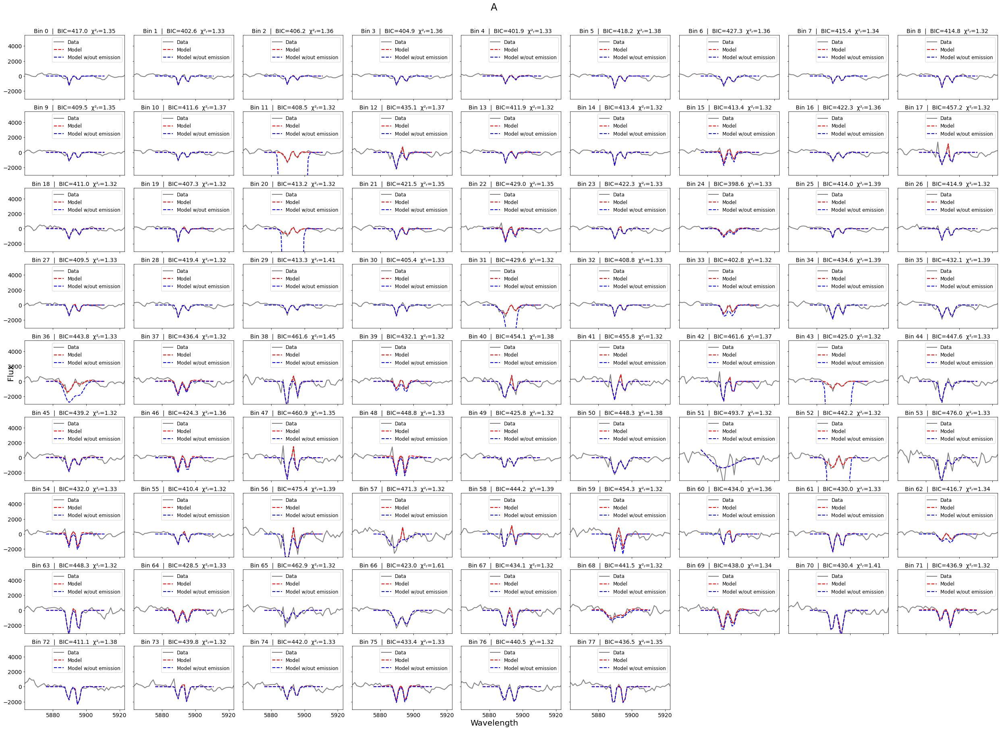

Saved: BIN_fits_A.pdf


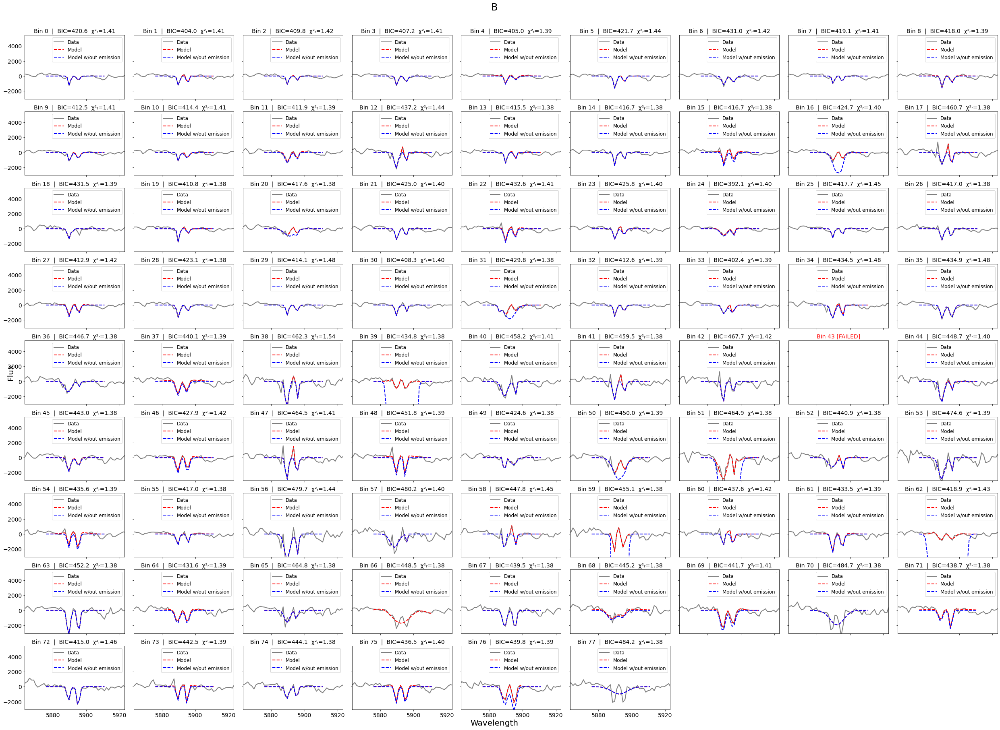

Saved: BIN_fits_B.pdf


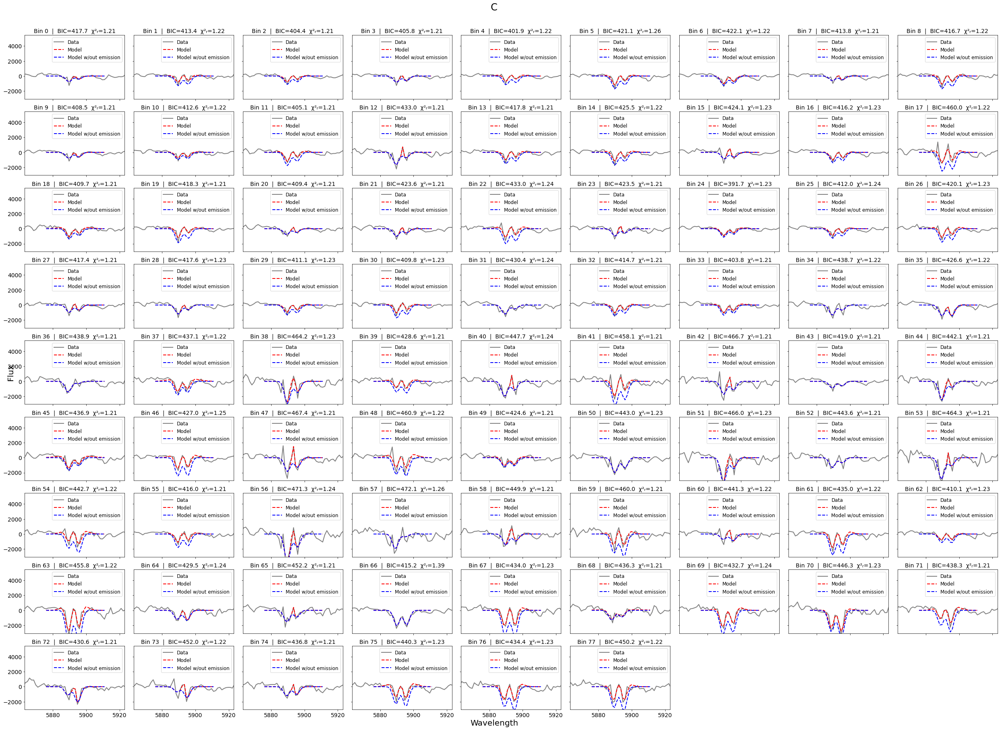

Saved: BIN_fits_C.pdf


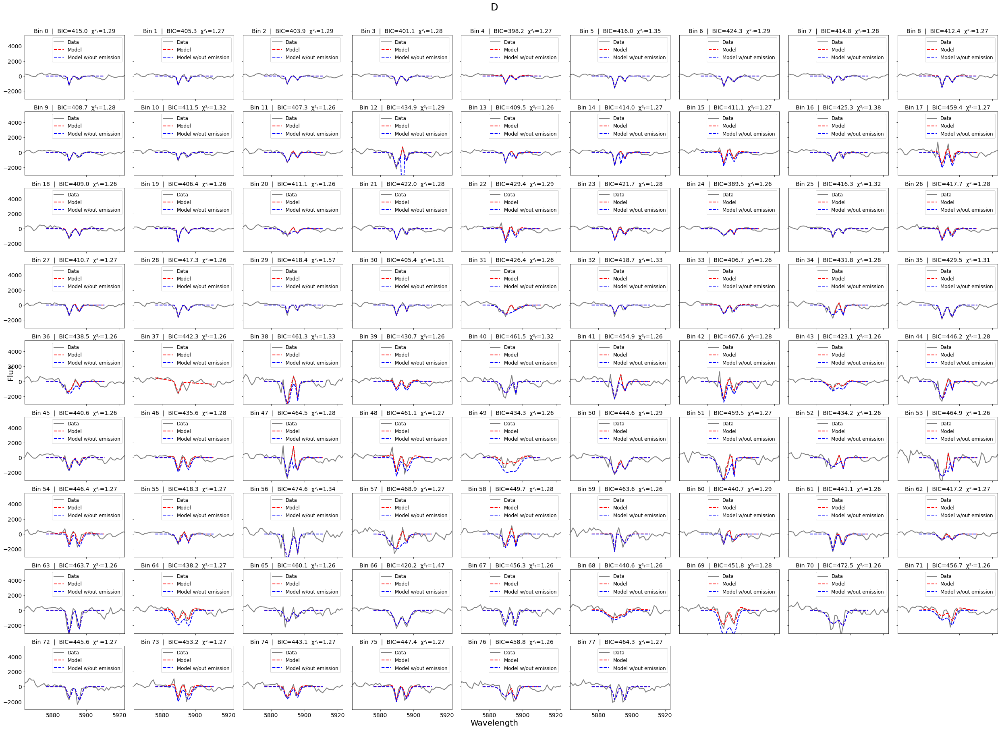

Saved: BIN_fits_D.pdf


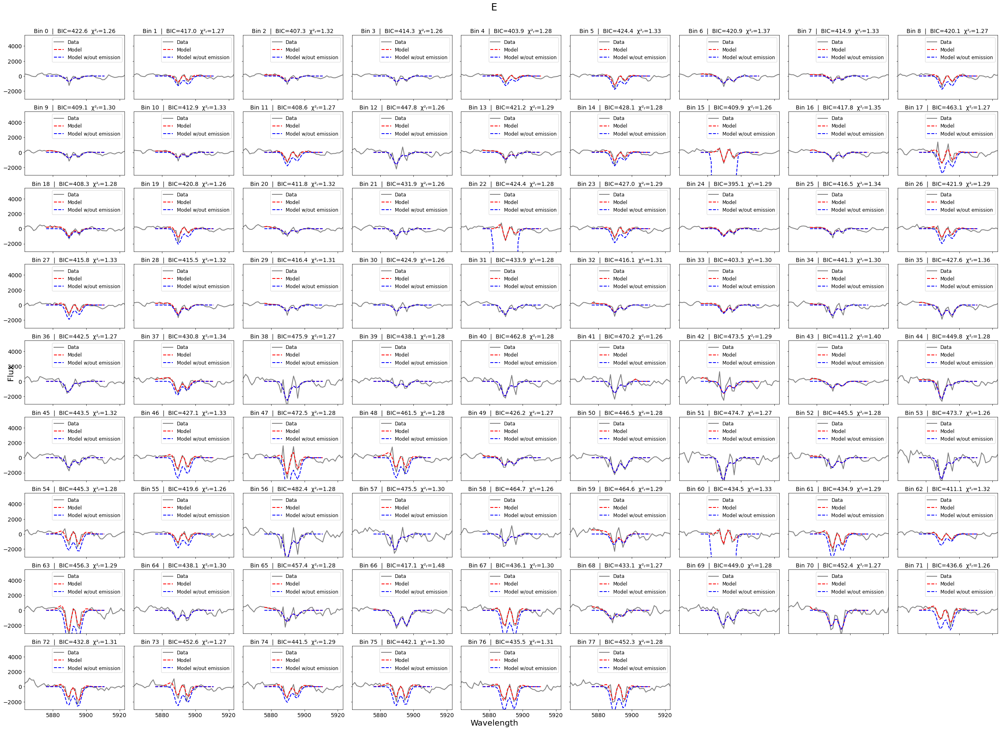

Saved: BIN_fits_E.pdf


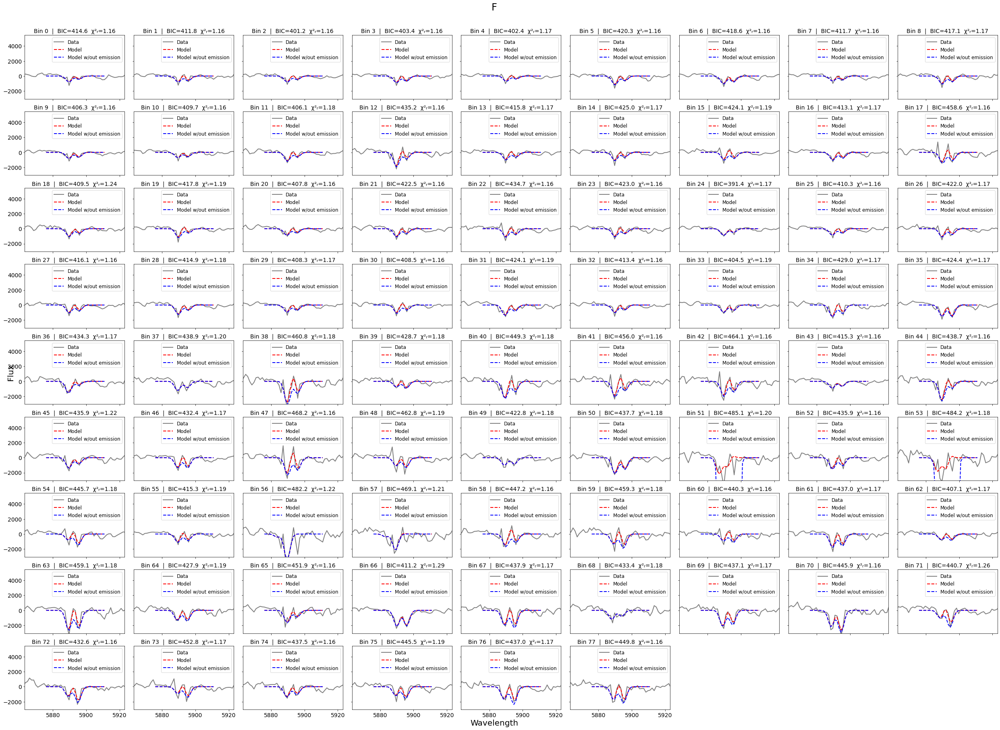

Saved: BIN_fits_F.pdf


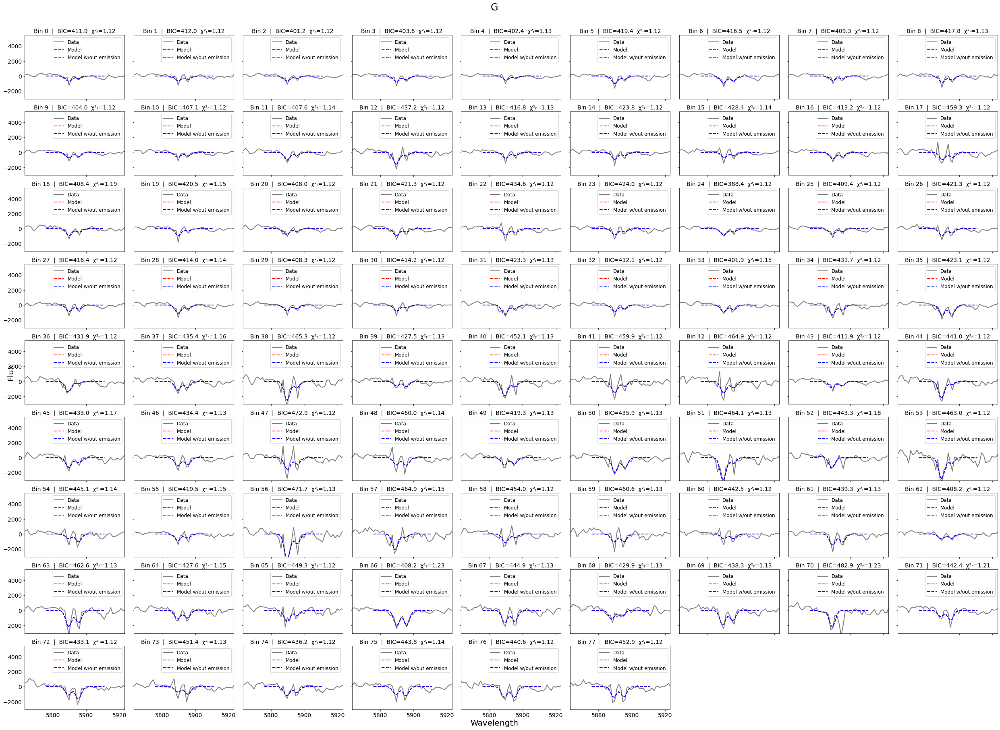

Saved: BIN_fits_G.pdf


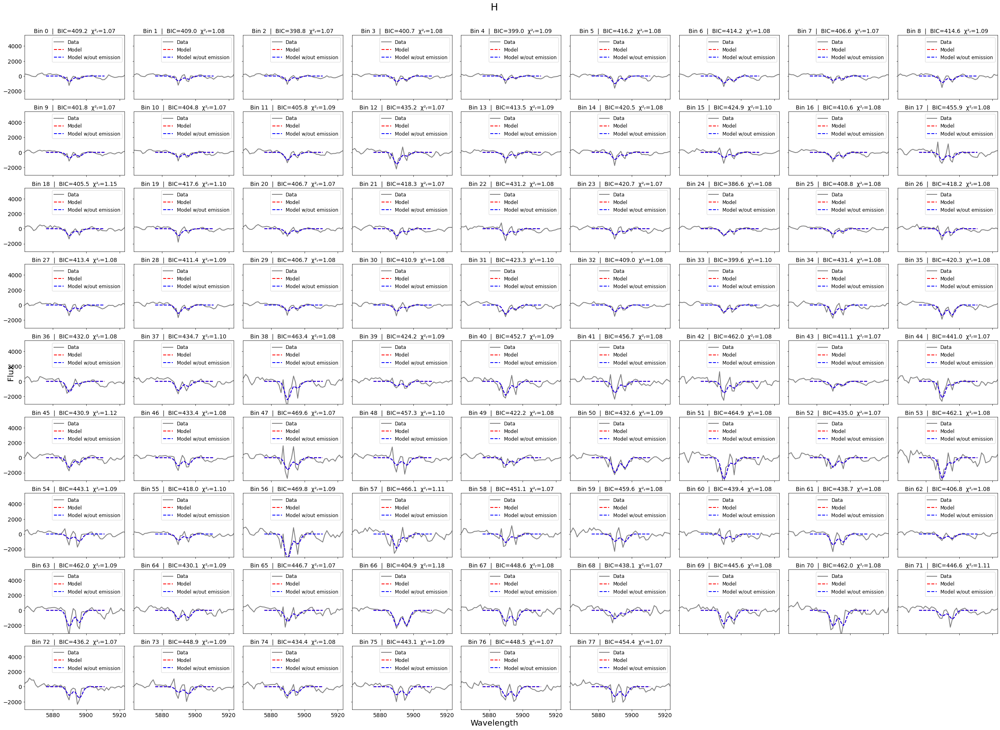

Saved: BIN_fits_H.pdf


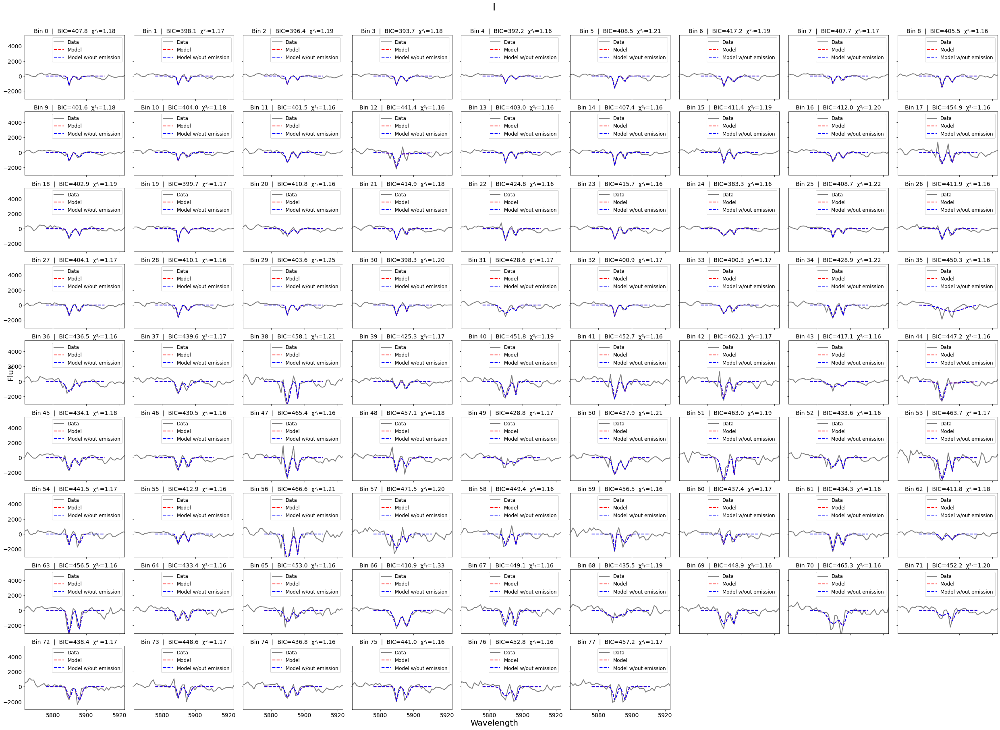

Saved: BIN_fits_I.pdf


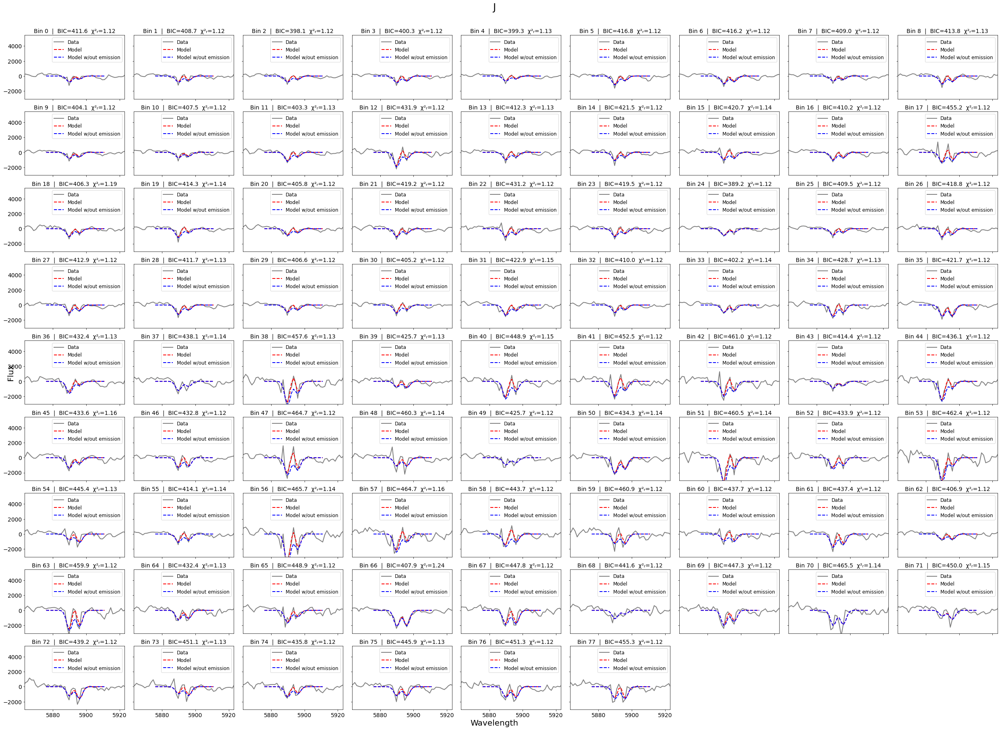

Saved: BIN_fits_J.pdf


In [50]:
x = len(spec_voronoi_bins)
NO_EMISSION = {"G", "H", "I"}

for model_name, (model_fn, _) in MODELS.items():
    model_params = results[model_name]["params"]
    model_fluxes = results[model_name]["models"]
    EWs_corr, EWs_ori = [], []
    ncols = int(np.ceil(np.sqrt(x)))
    nrows = int(np.ceil(x / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(35, 25), sharex=True, sharey=True)
    axes = np.array(axes).reshape(-1)
    for bin_id in range(x):
        ax = axes[bin_id]
        if model_params[bin_id] is None:
            ax.set_title(f"Bin {bin_id} [FAILED]", fontsize=14, color="red")
            continue
        popt      = model_params[bin_id]
        mflux     = model_fn(wave_fit, *popt)
        data      = spec_voronoi_bins[bin_id] - continuum_bins[bin_id]
        continuum = continuum_bins[bin_id][mask]

        if model_name in NO_EMISSION:
            emission_model   = np.zeros_like(wave_fit)
            absorption_model = mflux.copy()
        elif model_name == "E":
            # params: A1, mu1, A2, A3, mu3, sigma3
            A3, mu3, sigma3  = popt[-3], popt[-2], popt[-1]
            emission_model   = gaussian(wave_fit, abs(A3), mu3, sigma3)
            absorption_model = mflux - emission_model
        elif model_name == "F":
            # params: A1, mu1, A2, A3 — sigma fixed, mu3 fixed
            A3, mu3, sigma3  = popt[-1], 5893, SIGMA_FIXED
            emission_model   = gaussian(wave_fit, abs(A3), mu3, sigma3)
            absorption_model = mflux - emission_model
        elif model_name == "J":
            # params: A1, A2, A3 — all sigmas fixed, all mu fixed
            A3, mu3, sigma3  = popt[-1], 5893, SIGMA_FIXED
            emission_model   = gaussian(wave_fit, abs(A3), mu3, sigma3)
            absorption_model = mflux - emission_model
        else:  # A, B, C, D — emission last 2 params are A3, sigma3; mu3=5893
            A3, mu3, sigma3  = popt[-2], 5893, popt[-1]
            emission_model   = gaussian(wave_fit, abs(A3), mu3, sigma3)
            absorption_model = mflux - emission_model

        ax.plot(new_wave, data, color="black", linewidth=2, alpha=0.5, label="Data")
        ax.plot(wave_fit, mflux, color="red", linewidth=2, linestyle="dashed", label="Model")
        ax.plot(wave_fit, absorption_model, color="blue", linewidth=2,
                linestyle="dashed", label="Model w/out emission")
        bic_val  = results[model_name]["bic"][bin_id]
        chi2_val = results[model_name]["chi2r"][bin_id]
        ax.set_title(f"Bin {bin_id}  |  BIC={bic_val:.1f}  χ²ᵣ={chi2_val:.2f}", fontsize=14)
        ax.legend(fontsize=12)
        ax.set_xlim(na_rest - 30, na_rest + 30)
        ax.set_ylim(np.min(data) * 1.05, np.max(data) * 1.05)
        ax.tick_params(axis="both", labelsize=14)
        EWs_corr.append(-np.trapz(absorption_model / continuum, wave_fit))
        EWs_ori.append(-np.trapz(data[mask] / continuum, wave_fit))
    
    for ax in axes[x:]:
        ax.axis("off")
    safe_name = model_name.replace(" ", "_").replace("—", "-")
    fig.suptitle(model_name, fontsize=24, y=1.01)
    fig.supxlabel("Wavelength", fontsize=20)
    fig.supylabel("Flux", fontsize=20)
    plt.tight_layout()
    plt.savefig(f"BIN_fits_{safe_name}.pdf", bbox_inches="tight")
    plt.show()
    print(f"Saved: BIN_fits_{safe_name}.pdf")
    results[model_name]["EWs_corr"] = EWs_corr
    results[model_name]["EWs_ori"]  = EWs_ori

In [51]:
np.shape(EWs_ori)==np.shape(EWs_corr)
np.shape(EWs_ori)

(78,)

In [52]:
import sympy as sp
from IPython.display import display, Math, HTML

x_s, A1, A2, A3 = sp.symbols('x A_1 A_2 A_3')
mu1, mu2, mu3 = sp.symbols('mu_1 mu_2 mu_3')
sigma1, sigma2, sigma3 = sp.symbols('sigma_1 sigma_2 sigma_3')
sM = sp.Symbol('sigma_{MUSE}')
delta = sp.Symbol('delta')

def G(A, mu, sigma):
    return A * sp.exp(-((x_s - mu)**2) / (2 * sigma**2))

na1 = sp.Symbol('mu_{Na,1}')
na2 = sp.Symbol('mu_{Na,2}')

models_sym = {
    "A": G(A1, mu1, sigma1) + G(A2, mu1+delta, sigma1)          + G(A3, 5893, sigma3),
    "B": G(A1, mu1, sigma1) + G(A2, mu2, sigma2)                 + G(A3, 5893, sigma3),
    "C": G(A1, mu1, sM)     + G(A2, mu1+delta, sM)               + G(A3, 5893, sigma3),
    "D": G(A1, na1,  sigma1)+ G(A2, na2, sigma2)                 + G(A3, 5893, sigma3),
    "E": G(A1, mu1, sM)     + G(A2, mu1+delta, sM)               + G(A3, mu3,  sigma3),
    "F": G(A1, mu1, sM)     + G(A2, mu1+delta, sM)               + G(A3, 5893, sM),
    "G": G(A1, mu1, sM)     + G(A2, mu1+delta, sM),
    "H": G(A1, na1,  sM)    + G(A2, na2, sM),
    "I": G(A1, na1,  sigma1)+ G(A2, na2, sigma2),
    "J": G(A1, na1,  sM)    + G(A2, na2, sM)                     + G(A3, 5893, sM),
}

# free parameters and fixed constraints per model
param_notes = {
    "A": ("$A_1, \\mu_1, \\sigma_1, A_2, \\delta, A_3, \\sigma_3$",
          "$\\sigma_2 = \\sigma_1$,  $\\mu_2 = \\mu_1 + \\delta$,  $\\mu_3 = 5893$ Å"),
    "B": ("$A_1, \\mu_1, \\sigma_1, A_2, \\mu_2, \\sigma_2, A_3, \\sigma_3$",
          "$\\mu_3 = 5893$ Å"),
    "C": ("$A_1, \\mu_1, A_2, A_3, \\sigma_3$",
          "$\\sigma_1 = \\sigma_2 = \\sigma_\\mathrm{MUSE}$,  $\\mu_2 = \\mu_1 + \\delta$,  $\\mu_3 = 5893$ Å"),
    "D": ("$A_1, \\sigma_1, A_2, \\sigma_2, A_3, \\sigma_3$",
          "$\\mu_1, \\mu_2$ fixed to Na doublet,  $\\mu_3 = 5893$ Å"),
    "E": ("$A_1, \\mu_1, A_2, A_3, \\mu_3, \\sigma_3$",
          "$\\sigma_1 = \\sigma_2 = \\sigma_\\mathrm{MUSE}$,  $\\mu_2 = \\mu_1 + \\delta$"),
    "F": ("$A_1, \\mu_1, A_2, A_3$",
          "$\\sigma_1 = \\sigma_2 = \\sigma_3 = \\sigma_\\mathrm{MUSE}$,  $\\mu_2 = \\mu_1 + \\delta$,  $\\mu_3 = 5893$ Å"),
    "G": ("$A_1, \\mu_1, A_2$",
          "$\\sigma_1 = \\sigma_2 = \\sigma_\\mathrm{MUSE}$,  $\\mu_2 = \\mu_1 + \\delta$,  no emission"),
    "H": ("$A_1, A_2$",
          "$\\mu_1, \\mu_2$ fixed to Na doublet,  $\\sigma_1 = \\sigma_2 = \\sigma_\\mathrm{MUSE}$,  no emission"),
    "I": ("$A_1, A_2, \\sigma_1, \\sigma_2$",
          "$\\mu_1, \\mu_2$ fixed to Na doublet,  no emission"),
    "J": ("$A_1, A_2, A_3$",
          "$\\mu_1, \\mu_2$ fixed to Na doublet,  $\\sigma_1 = \\sigma_2 = \\sigma_3 = \\sigma_\\mathrm{MUSE}$,  $\\mu_3 = 5893$ Å"),
}

for name, expr in models_sym.items():
    n_params = MODELS[name][0].__code__.co_argcount - 1
    display(HTML(f"<h4 style='margin-bottom:2px'>Model {name} &nbsp;|&nbsp; {n_params} free parameters</h4>"))
    display(Math(r'f(x) = ' + sp.latex(expr)))
    free, fixed = param_notes[name]
    display(HTML(
        f"<p style='margin-left:20px; font-size:13px; color:#333'>"
        f"<b>Free:</b> {free} &nbsp;|&nbsp; <b>Fixed:</b> <span style='color:gray'>{fixed}</span>"
        f"</p>"
    ))

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

<IPython.core.display.Math object>

In [96]:
##### EW histogram for best model with 5-sigma clipping 
best_model_name = min(
    MODELS.keys(),
    key=lambda name: (
        #np.nanmedian(results[name]["bic"]),
        np.nanmedian(results[name]["chi2r"])
    )
)
print(f"Best model: {best_model_name}")

Best model: H


In [114]:
best_model_name='J'

In [115]:
colors = [plt.cm.Set1(i) for i in [0, 1, 2]]
colors = ['#E74C3C', '#3498DB', '#2ECC71']  # red, blue, green

  Clipped 5 outliers beyond 2σ
  Clipped 4 outliers beyond 2σ


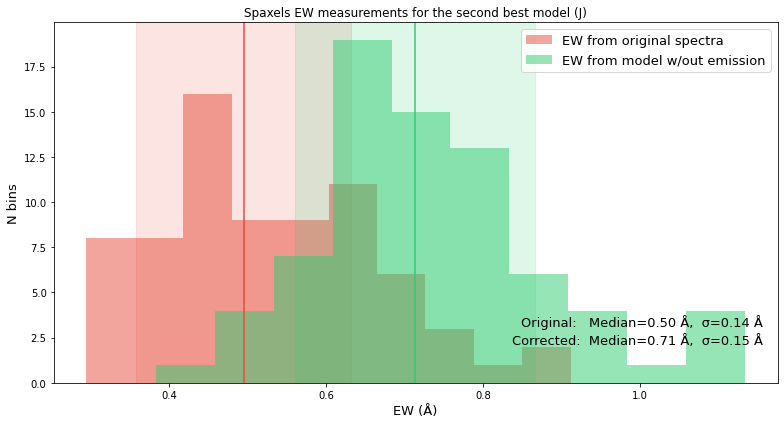

In [117]:
def sigma_clip(arr, nsigma=2):
    arr  = np.array(arr)
    med  = np.median(arr)
    std  = np.std(arr)
    mask = np.abs(arr - med) < nsigma * std
    n_clipped = np.sum(~mask)
    if n_clipped:
        print(f"  Clipped {n_clipped} outliers beyond {nsigma}σ")
    return arr[mask]

EWs_ori_c  = sigma_clip(results[best_model_name]["EWs_ori"])
EWs_corr_c = sigma_clip(results[best_model_name]["EWs_corr"])

median_ori  = np.median(EWs_ori_c)
sigma_ori   = np.std(EWs_ori_c)
median_corr = np.median(EWs_corr_c)
sigma_corr  = np.std(EWs_corr_c)

plt.figure(figsize=(11, 6))
plt.title(f"Spaxels EW measurements for the second best model ({best_model_name})")

plt.hist(EWs_ori_c,  label="EW from original spectra",     alpha=0.5,color=colors[0])
plt.axvline(x=median_ori, color=colors[0])
plt.axvspan(median_ori - sigma_ori, median_ori + sigma_ori, alpha=0.15, color=colors[0])

plt.hist(EWs_corr_c, label="EW from model w/out emission", alpha=0.5,color=colors[2])
plt.axvline(x=median_corr, color=colors[2])
plt.axvspan(median_corr - sigma_corr, median_corr + sigma_corr, alpha=0.15, color=colors[2])

plt.legend(fontsize=13)
plt.text(0.98, 0.15, f"Original:   Median={median_ori:.2f} Å,  σ={sigma_ori:.2f} Å",
         ha='right', va='bottom', transform=plt.gca().transAxes, fontsize=13)
plt.text(0.98, 0.10, f"Corrected:  Median={median_corr:.2f} Å,  σ={sigma_corr:.2f} Å",
         ha='right', va='bottom', transform=plt.gca().transAxes, fontsize=13)
plt.xlabel("EW (Å)", fontsize=13)
plt.ylabel("N bins", fontsize=13)
plt.tight_layout()
plt.savefig(f"EW_histogram_{best_model_name.replace(' ', '_')}.pdf", bbox_inches="tight")
plt.show()

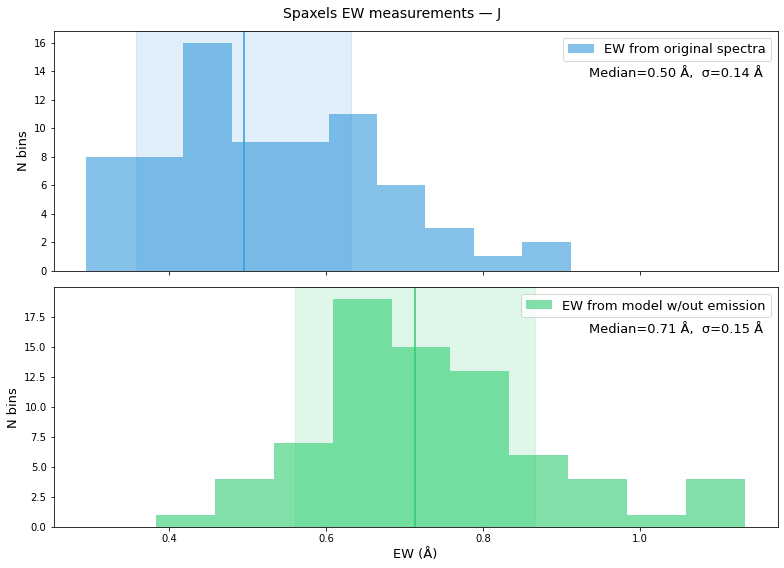

In [118]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(11, 8), sharex=True)
fig.suptitle(f"Spaxels EW measurements — {best_model_name}", fontsize=14)

ax1.hist(EWs_ori_c, alpha=0.6, color=colors[1], label="EW from original spectra")
ax1.axvline(x=median_ori, color=colors[1])
ax1.axvspan(median_ori - sigma_ori, median_ori + sigma_ori, alpha=0.15, color=colors[1])
ax1.text(0.98, 0.85, f"Median={median_ori:.2f} Å,  σ={sigma_ori:.2f} Å",
         ha='right', va='top', transform=ax1.transAxes, fontsize=13)
ax1.legend(fontsize=13)
ax1.set_ylabel("N bins", fontsize=13)

ax2.hist(EWs_corr_c, alpha=0.6, color=colors[2], label="EW from model w/out emission")
ax2.axvline(x=median_corr, color=colors[2])
ax2.axvspan(median_corr - sigma_corr, median_corr + sigma_corr, alpha=0.15, color=colors[2])
ax2.text(0.98, 0.85, f"Median={median_corr:.2f} Å,  σ={sigma_corr:.2f} Å",
         ha='right', va='top', transform=ax2.transAxes, fontsize=13)
ax2.legend(fontsize=13)
ax2.set_ylabel("N bins", fontsize=13)
ax2.set_xlabel("EW (Å)", fontsize=13)

plt.tight_layout()
plt.savefig(f"EW_histogram_{best_model_name.replace(' ', '_')}.pdf", bbox_inches="tight")
plt.show()

In [119]:
2737+(halpha-6500)*(2737-2484)/(7000-6500)

2799.3711166584

In [120]:
print("From the MUSE table I expect R = ", halpha/2800, "\n\nFrom my Halpha measurements I convert sigma from the fit into a FWHM of ", 1.75*2*np.sqrt(2*math.log(2)))

From the MUSE table I expect R =  2.3654510987142854 

From my Halpha measurements I convert sigma from the fit into a FWHM of  4.120935078804162


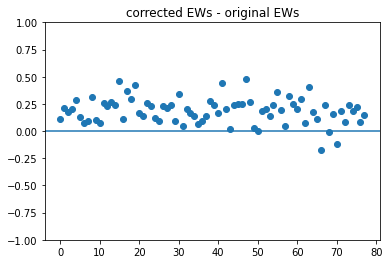

In [121]:
y=np.subtract(EWs_corr,EWs_ori)
plt.scatter(np.arange(len(EWs_corr)),y)
plt.ylim([-1,1])
plt.title("corrected EWs - original EWs")
plt.axhline(y=0)

In [122]:
best_model_name

'J'

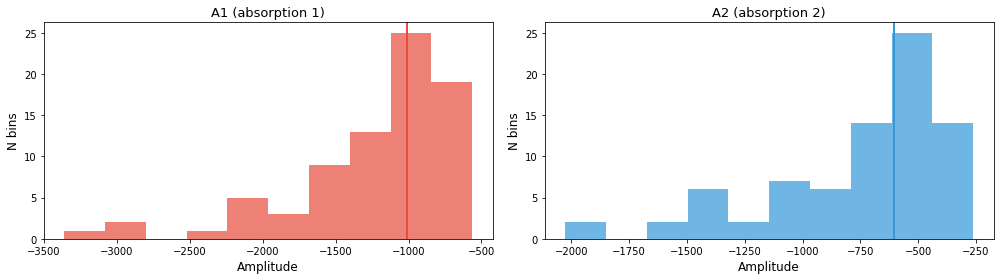

In [123]:
params_arr = np.array([p for p in results['H']["params"] if p is not None])

A1_vals = params_arr[:, 0]   # absorption peak 1
A2_vals = params_arr[:, 1]   # absorption peak 2

fig, axes = plt.subplots(1, 2, figsize=(14, 4))
for ax, vals, label, color in zip(axes,
                                   [A1_vals, A2_vals],
                                   ["A1 (absorption 1)", "A2 (absorption 2)"],
                                   colors):
    ax.hist(vals, alpha=0.7, color=color)
    ax.axvline(np.median(vals), color=color, linewidth=2)
    ax.set_title(label, fontsize=13)
    ax.set_xlabel("Amplitude", fontsize=12)
    ax.set_ylabel("N bins", fontsize=12)

plt.tight_layout()
plt.show()

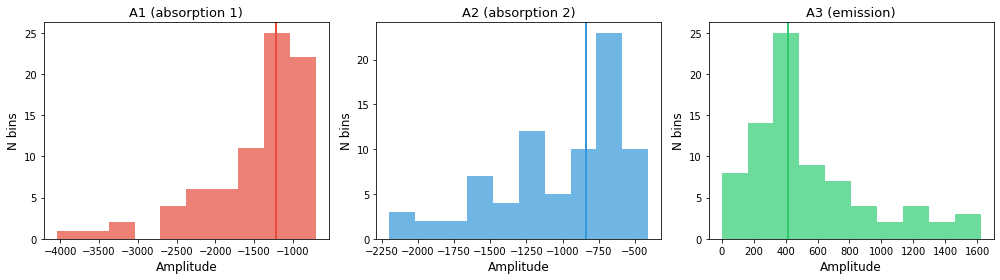

In [129]:
params_arr = np.array([p for p in results['J']["params"] if p is not None])

A1_vals = params_arr[:, 0]   # absorption peak 1
A2_vals = params_arr[:, 1]   # absorption peak 2
A3_vals = params_arr[:, 2]   # emisson peak


fig, axes = plt.subplots(1, 3, figsize=(14, 4))
for ax, vals, label, color in zip(axes,
                                   [A1_vals, A2_vals, A3_vals],
                                   ["A1 (absorption 1)", "A2 (absorption 2)", "A3 (emission)"],
                                   colors):
    ax.hist(vals, alpha=0.7, color=color)
    ax.axvline(np.median(vals), color=color, linewidth=2)
    ax.set_title(label, fontsize=13)
    ax.set_xlabel("Amplitude", fontsize=12)
    ax.set_ylabel("N bins", fontsize=12)

plt.tight_layout()
plt.show()

# NMF

In [40]:
from sklearn.decomposition import NMF

# NMF requires non-negative data
X_nmf = X_clean.copy()
X_nmf[X_nmf < 0] = 0.0

nmf = NMF(n_components=4,init="nndsvda",
    max_iter=1000,random_state=0)

W = nmf.fit_transform(X_nmf)   # (n_spaxels, n_components)
H = nmf.components_            # (n_components, n_wave_used)

In [34]:
# plotting the precision score https://towardsdatascience.com/using-nmf-to-classify-companies-a77e176f276f/

err = np.linalg.norm(X_nmf - W @ H)**2/np.linalg.norm(X_nmf)**2
print(err)

0.001301843824213024


In [29]:
err = nmf.reconstruction_err_
err

23581.63895915634

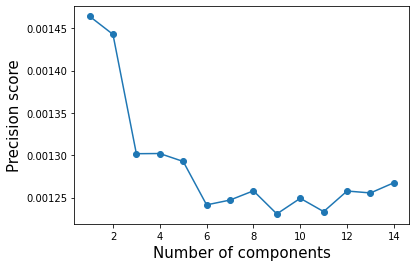

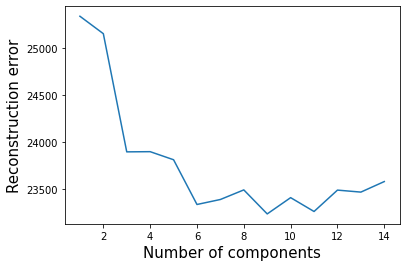

In [32]:
ks = range(1, 15)
errors = []
aux=[]
for k in ks:
    nmf = NMF(n_components=k, init="nndsvda", max_iter=1000, random_state=0)
    W = nmf.fit_transform(X_nmf)
    H = nmf.components_
    err = np.linalg.norm(X_nmf - W @ H)**2 / np.linalg.norm(X_nmf)**2 #precision score
    errors.append(err)
    aux.append(nmf.reconstruction_err_)

plt.plot(ks, errors, marker="o")
plt.xlabel("Number of components",fontsize=15)
plt.ylabel("Precision score",fontsize=15)
plt.show()

plt.plot(ks,aux)
plt.xlabel("Number of components",fontsize=15)
plt.ylabel("Reconstruction error",fontsize=15)
plt.show()


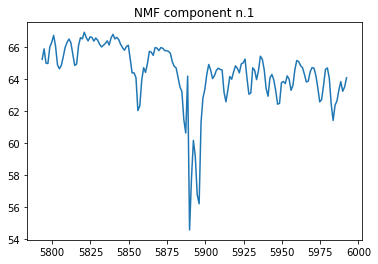

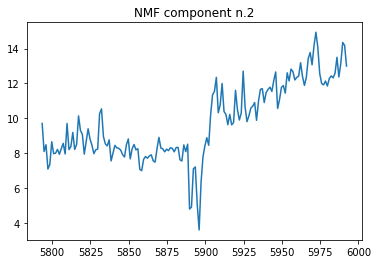

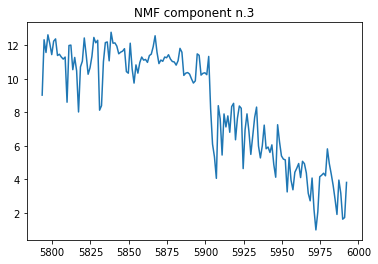

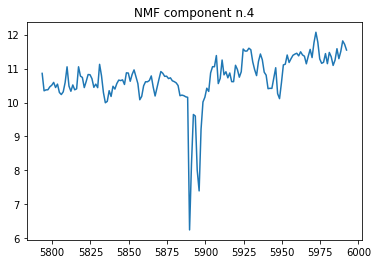

In [41]:
for k in range(H.shape[0]):
    plt.plot(new_wave, H[k], label=f"NMF {k+1}")
    plt.title(f"NMF component n.{k+1}")
    plt.show()


In [222]:
comp = 0
map_k = W[:, comp].reshape(ny, nx)

plt.imshow(map_k, origin="lower")
plt.colorbar(label="Weight")
plt.title(f"NMF component {comp+1}")
plt.show()

ValueError: cannot reshape array of size 194518 into shape (341,604)

# SVD

In [14]:
from sklearn.decomposition import TruncatedSVD

svd = TruncatedSVD(n_components=2, random_state=0)
X_svd = svd.fit_transform(X_scaled)

components = svd.components_   # (n_components, n_wave_used)
explained = svd.explained_variance_ratio_

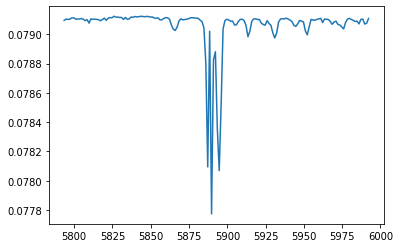

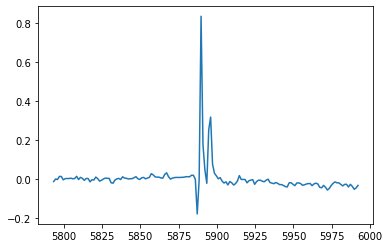

In [15]:
np.shape(components)
for i in range(0,len(components)):
    plt.plot(new_wave, components[i])
    plt.show()

# measuring EW from eigenspectra

# bootstrap for final EW measurement

In [266]:
import numpy as np
data=np.load("temp_EW_measurements.npy")

In [146]:
y=np.transpose(data)[0]
EW_errs=np.transpose(data)[1]
x=np.arange(0,len(y))

SNRs=np.divide(y,EW_errs)

In [147]:
sigma = np.array(EW_errs)

w = 1 / sigma**2

weighted_mean = np.sum(w * y) / np.sum(w)
mean_unc = np.sqrt(1 / np.sum(w))


weighted_std_dev = np.sqrt(np.sum(w * (y - weighted_mean)**2) / np.sum(w))
mean=np.mean(y)
mad = np.mean(np.abs(y - np.mean(y)))
median = np.median(y)
std = np.std(y, ddof=1) 

#std_dev = np.sqrt(np.sum((y -  weighted_mean)**2) / len(y))

In [148]:
weighted_mean
bootsample

array([0.78105959, 0.62564291, 0.46584909, 0.51499874, 0.47844998,
       0.54243836, 0.61002571, 0.59657109, 0.56311262, 0.47892138,
       0.59657109, 0.36323923, 0.47844998, 0.47844998, 0.50315015,
       0.50315015, 0.51499874, 0.44779861, 0.66318224, 0.50315015,
       0.56311262, 0.36323923, 0.54612955, 0.78105959, 0.66318224,
       0.54243836, 0.42676209, 0.49025984, 0.59657109, 0.54612955])

In [90]:
boot_means = []
for _ in range(10000):
    bootsample = np.random.choice(y,size=30, replace=True)
    boot_means.append(bootsample.mean())
    
    
bootmean = np.mean(boot_means)
bootmean_std = np.std(boot_means)

In [87]:
boot_means = []
for _ in range(10000):
    
    indices = np.random.choice(len(y), size=len(y), replace=True)
    y_sample = y[indices]
    sigma_sample = sigma[indices]
    w_sample = 1 / sigma_sample**2
    
    boot_mean = np.sum(w_sample * y_sample) / np.sum(w_sample)
    boot_means.append(boot_mean)

boot_means = np.array(boot_means)
bootmean = np.mean(boot_means)
bootmean_std = np.std(boot_means, ddof=1)

In [88]:
bootmean

0.49874179447632233

0.49899823074392663 0.01873282257409509


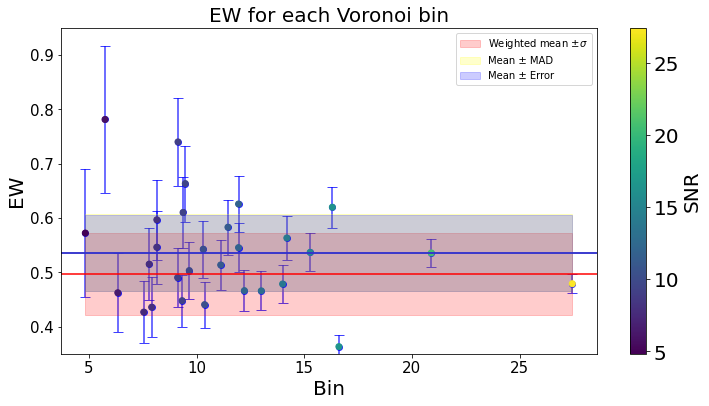

In [79]:
fig, ax = plt.subplots(figsize=(12, 6))

# scatter with colormap (this is what the colorbar must be attached to)
sc = ax.scatter(SNRs, y, c=SNRs, cmap='viridis', zorder=2)

ax.errorbar(
    SNRs, y, yerr=EW_errs,
    fmt='o', color='blue',
    alpha=0.75, capsize=5, zorder=1
)

# create ONE colorbar, tied to the scatter
cbar = fig.colorbar(sc, ax=ax)
cbar.set_label('SNR', fontsize=20)
cbar.ax.tick_params(labelsize=20)

ax.set_xlabel("Bin", fontsize=20)
ax.set_ylabel("EW", fontsize=20)
ax.set_title("EW for each Voronoi bin", fontsize=20)

ax.axhline(y=weighted_mean,color="red")
ax.fill_between([SNRs.min(), SNRs.max()],weighted_mean - weighted_std_dev,weighted_mean + weighted_std_dev,color='red',alpha=0.2,label=r'Weighted mean $\pm \sigma$')

ax.axhline(y=mean,color="yellow")
ax.fill_between([SNRs.min(), SNRs.max()],mean - mad,mean + mad,color='yellow',alpha=0.2,label='Mean ± MAD')

ax.axhline(y=median,color="blue")
ax.fill_between([SNRs.min(), SNRs.max()],median - mad,median + mad,color='blue',alpha=0.2,label='Mean ± Error')


print(boot_mean_val, boot_err)
ax.set_ylim(0.35, 0.95)
ax.tick_params(axis='both', which='major', labelsize=15)
plt.legend()


In [92]:
print(f"The median is {median:.2f} +/- {mad:.2f} (mean absolute deviation)")
print(f"The mean is {mean:.2f} +/-  {std:.2f} (standard deviation)")
print(f"The weigthed mean is {weighted_mean:.2f} +/- {weighted_std_dev:.2f} (weigthed standard deviation)")
print(f"The bootstrap mean is {bootmean:.2f} +/- {bootmean_std:.2f} (standard deviation of bootstrap estimates)")

The median is 0.54 +/- 0.07 (mean absolute deviation)
The mean is 0.54 +/-  0.09 (standard deviation)
The weigthed mean is 0.50 +/- 0.08 (weigthed standard deviation)
The bootstrap mean is 0.54 +/- 0.02 (standard deviation of bootstrap estimates)


# Windwo and continuum studies

In [2]:
import numpy as np
data=np.load("temp_window_cont.npy")

wave, spectrum=np.transpose(data)


In [3]:
na_rest=(5890+5896)/2
best_KS=best_continuum(wave, spectrum, wavelength=na_rest,vel=400,plots=True,save="Best-continuum.pdf")



EW= 0.27  +/-  0.044853544666462436

Node separation =  29.444444444444446  Angstrom
SNR of the line is  5.920721375393585

EW= 0.30  +/-  0.05075751984505064

Node separation =  44.16666666666667  Angstrom
SNR of the line is  5.978843660910401

EW= 0.33  +/-  0.05132174433340707

Node separation =  58.88888888888889  Angstrom
SNR of the line is  6.363575527982117

EW= 0.34  +/-  0.05110192671576518

Node separation =  73.61111111111111  Angstrom
SNR of the line is  6.6908281853351

EW= 0.36  +/-  0.05170823196510022

Node separation =  88.33333333333334  Angstrom
SNR of the line is  6.910682559709672

EW= 0.37  +/-  0.05265492501814436

Node separation =  103.05555555555556  Angstrom
SNR of the line is  7.056306183253604

EW= 0.38  +/-  0.05373143823091684

Node separation =  117.77777777777779  Angstrom
SNR of the line is  7.106203210302466

EW= 0.39  +/-  0.05453597349779116

Node separation =  132.5  Angstrom
SNR of the line is  7.113462731258132

EW= 0.39  +/-  0.054953106540468


In [4]:
best_KS

100

In [292]:
wave[2]-wave[1]

1.25

In [293]:
best_KS

100

In [294]:
get_velocity_separation(100, wave[2]-wave[1], na_rest)

6359.079798065501

In [295]:

# inspect best window
best_window=best_integration_window(wave, spectrum, wavelength=na_rest,best_KS=best_KS,plots=True,save="Best-window.pdf")


EW= 0.21  +/-  0.15670718525209645

Node separation =  147.22222222222223  Angstrom
SNR of the line is  1.3453708593609983

EW= 0.21  +/-  0.15670718525209645

Node separation =  147.22222222222223  Angstrom
SNR of the line is  1.3453708593609983

EW= 0.25  +/-  0.1602027962066695

Node separation =  147.22222222222223  Angstrom
SNR of the line is  1.5375387388589157

EW= 0.25  +/-  0.09554365084939839

Node separation =  147.22222222222223  Angstrom
SNR of the line is  2.578067752817355

EW= 0.33  +/-  0.12628198074353209

Node separation =  147.22222222222223  Angstrom
SNR of the line is  2.616193629873466

EW= 0.33  +/-  0.12628198074353209

Node separation =  147.22222222222223  Angstrom
SNR of the line is  2.616193629873466

EW= 0.33  +/-  0.12628198074353209

Node separation =  147.22222222222223  Angstrom
SNR of the line is  2.616193629873466

EW= 0.33  +/-  0.12628198074353209

Node separation =  147.22222222222223  Angstrom
SNR of the line is  2.616193629873466

EW= 0.33  +/-

In [296]:
best_window

400

In [302]:
EW_voronoi_bins(np.array([spectrum]),wave,na_rest,v=best_window,KS=best_KS,plots=False,save="ola.pdf")

## Saving image with name  olaEW=0.39.pdf

EW= 0.39  +/-  0.054953106540468

Node separation =  147.22222222222223  Angstrom
SNR of the line is  7.114700668190731


([0.3909749038226241], [0.054953106540468], [7494.767803608802])

In [298]:
best_KS

100

# Final EW vs SNR

Text(29.875, 0.5, 'Final EW measurement')

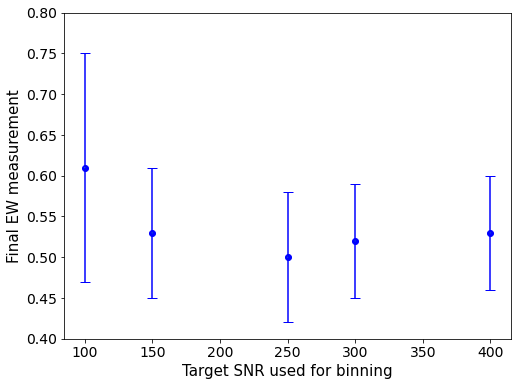

In [24]:
import numpy as np

import matplotlib.pyplot as plt
x=[100,150,250,300,400]
y=[0.61,0.53,0.50,0.52,0.53]
yerr=[0.14,0.08,0.08,0.07,0.07]

plt.figure(figsize=(8, 6))
plt.yticks(fontsize=14)
plt.xticks(fontsize=14)
scatter=plt.errorbar(x,y,yerr, fmt='o', c='Blue', capsize=5,zorder=1)
scatter=plt.scatter(x,y,yerr,zorder=2)
plt.ylim([0.4,0.8])
plt.savefig("EW_for_different_target_SNRs.pdf", bbox_inches='tight')
plt.xlabel("Target SNR used for binning",fontsize=15)
plt.ylabel("Final EW measurement",fontsize=15)

In [ ]:
matplotlib.pyplot.errorbar(x, y, yerr=None, xerr=None, fmt='', *, ecolor=None, elinewidth=None, capsize=None, barsabove=False, lolims=False, uplims=False, xlolims=False, xuplims=False, errorevery=1, capthick=None, data=None, **kwargs)

In [ ]:
import numpy as np
import matplotlib.pyplot as plt



na_rest=(5890+5896)/2
halpha=6562.8

SN_name="SN2010ev"
if SN_name=="SN2010ev":
    z=0.00921
    ra, dec = 156.370792, -39.830889
spectra=[]


for fname in sorted(glob.glob("./milky-way/outliers/*.npy")):
    w, f = np.load(fname, allow_pickle=True)
    spectra.append(f)

In [ ]:
EWs_Halpha = []
EWs_Na = []
EWs_Halpha_err = []
EWs_Na_err = []

for i in range(0,len(spectra)):
    out=EW_voronoi_bins(np.array([spectra[i]]), w, halpha*(1+z),v=400, KS=100, text=False,plots=False)
    EWs_Halpha.append(out[0][0])
    EWs_Halpha_err.append(out[1][0])

    out=EW_voronoi_bins(np.array([spectra[i]]), w, na_rest,v=400, KS=100, text=False,plots=True)
    EWs_Na.append(out[0][0])
    EWs_Na_err.append(out[1][0])

In [ ]:
plt.figure(figsize=(14, 12))
ratio = np.divide(EWs_Na,EWs_Na_err)
sc=plt.scatter(EWs_Na,EWs_Halpha,c=ratio,cmap='viridis',zorder=2)
plt.errorbar(EWs_Na,EWs_Halpha, yerr=EWs_Halpha_err,xerr=EWs_Na_err, alpha=0.5,fmt='o', c='Blue', capsize=5,zorder=1)

cbar = plt.colorbar(sc)
cbar.set_label("EWs_Na / EWs_Na_err", fontsize=15)
plt.xlabel("MW Na doublet EW",fontsize=20)
plt.ylabel("Host Halpha EW",fontsize=20)

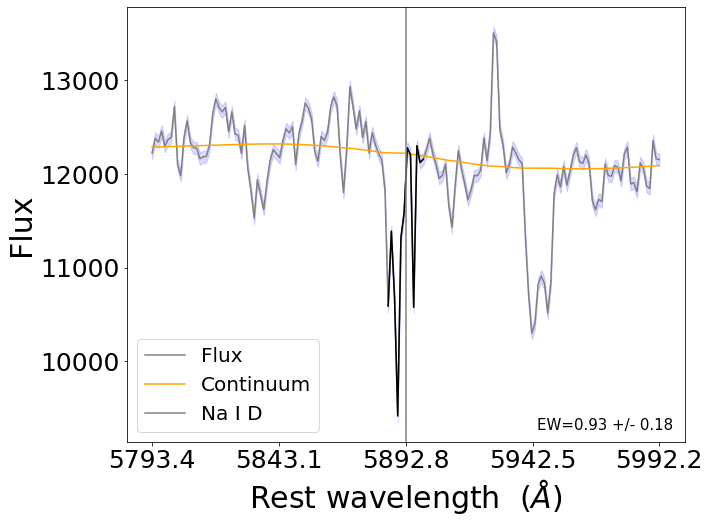

In [115]:
out=EW_voronoi_bins(np.array([spectra[11]]), w, na_rest,v=400, KS=100, text=False,plots=True)

Number of dips: 0


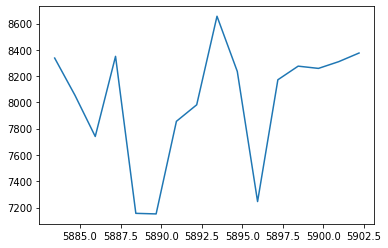

In [110]:
v=500
bound1=na_rest*(1-v/(3*10**5))
bound2=na_rest*(1+v/(3*10**5))

from scipy.signal import find_peaks
x_chopped,y_chopped=chop_data(w,y,bound1,bound2)
plt.plot(x_chopped,y_chopped)

inverted_flux = np.max(y) - y_chopped


peaks, properties = find_peaks(
    inverted_flux,
    prominence=0.05 * np.ptp(y),  # relative to the full flux range
    width=1                       # optional: ignore very narrow spikes
)

# Number of dips
num_dips = len(peaks)
print("Number of dips:", num_dips)


In [72]:
- REDO THIS PLOT WITH MORE POINTS
- plow ew vs voronoi bin but excluding the ones with 3 dips

SyntaxError: invalid syntax (109765389.py, line 1)

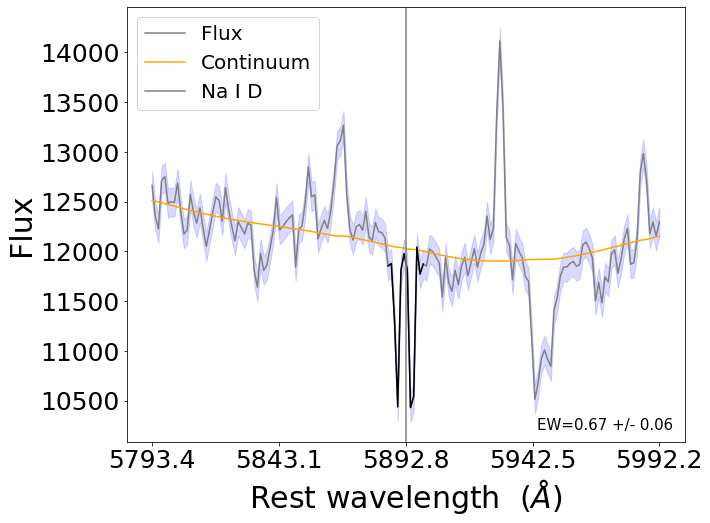


EW= 0.67  +/-  0.055362158208232475

Node separation =  139.96478873239437  Angstrom
SNR of the line is  12.131298688911595


([0.671614877286847], [0.055362158208232475], [7125.307418923861])

In [25]:
import numpy as np
import matplotlib.pyplot as plt


ew_val=0.67

na_rest=(5890+5896)/2
halpha=6562.8

SN_name="SN2010ev"
if SN_name=="SN2010ev":
    z=0.00921
    ra, dec = 156.370792, -39.830889


w,f = np.load("./milky-way/outliers/"+str(ew_val)+".npy")

EW_voronoi_bins(np.array([f]),w,na_rest,v=400,KS=100,plots=True)

array([4748.44238281, 4749.69238281, 4750.94238281, ..., 9345.94238281,
       9347.19238281, 9348.44238281])

In [ ]:
plot EW na vs EW Halpha

In [36]:

3 - for the good EW bins, is d2/d1 constant?
4 - plot d2/d1 for all bins. and see if d2/d1 happens only for bins with outlying EW of na i D.


is there correlation between high EW of Na i D and emission of halpha? then this could be a stellar contribution
Na I D outflow absorption. in a star forming region (check this, is halpha qutie large?). is halpah also showing a blueshiffted component in this bin only?

This is almost certainly a blueshifted Na I D absorption component from neutral gas in the host (outflow / streaming), not stellar absorption and not MW.

5886.0

In [14]:
to do:
    best window or continuum
    na incerteza de EW incluir o erro por estar a incluir varios espetros

SyntaxError: invalid syntax (1805529083.py, line 1)

In [40]:
5797*(1+z)

5850.39037

In [7]:
KSs=np.arange(20,300,20)
KSs

array([ 10,  30,  50,  70,  90, 110, 130, 150, 170, 190, 210, 230, 250,
       270, 290])

In [ ]:
plo